# Investigating particle swarm optimisation in solving the Travelling Salesman Problem

## Abstract

Particle Swarm Optimisation (PSO) is a computational technique used to optimise a problem by iteratively improving the particles based on eachother, taking inspiration from nature, such as from birds in flight. PSO has many applications, from robotics to networks.

The Travelling Salesman Problem is a famous combinatorial optimisation problem which asks for the shortest route by which a salesman can visit a set of locations and return home. It is NP-hard, meaning that there is no efficient algorithm that can solve it in polynomial time. Hence, approximation methods such as PSO are necessary.

In this notebook I investigate using PSO in solving instances of the Travelling Salesman Problem, taken from the TSPLIB dataset. A variety of instances, from small (burma14) to medium (att48) to large (lin105) were used in testing it.

I developed 2 variants of the optimiser, based on 2 approaches taken from 2 different papers:
<li>The first approach utilising velocity based swaps and greedy initialisation, the idea taken from [1] </li>
<li>A second approach using segment reinsertion inspired by genetic mutations, inspired by [2]</li>

The results show that segment reinsertion is significantly better in performance than the other approach taken, and consistently provides optimal solutions, on par with and if not better than the results found in [2].

## Learning Objectives

<li>Explore the effectiveness of different particle swarm optimisation variants in solving instances of the Travelling Salesman Problem.</li>
<li>Investigate how tuning the parameters and balancing exploration with exploitation can impact the results.</li>
<li>Test the algorithms on a variety of problem instances, analysing their performance and results.</li>
<li>Compare the results with the original implementations discussed in the papers.</li>

## Contents

1. [Modules](#Modules)  
   1.1. [TSPLIB Dataset Overview](##TSPLIB-Dataset-Overview)  
      1.1.1. [Parsing](###Parsing)  
      1.1.2. [burma14](###burma14)  
      1.1.3. [att48](###att48)  
      1.1.4. [lin105](###lin105)  
   1.2. [PSO Implementations](##PSO-Implementations)  
      1.2.1. [PSO Variant 1 (velocity based swap mutations)](###PSO-Variant-1-(velocity-based-swap-mutations))  
      1.2.2. [PSO Variant 2 (genetic inspired segment reinsertion)](###PSO-Variant-2-(genetic-inspired-segment-reinsertion))
2. [Analysis](#Analysis)  

   2.1. [burma14 analysis](##burma14-Analysis)  
      2.1.1. [Initial Comparison](###Initial-Comparison-1)  
         2.1.1.1. [V1](#v1)  
         2.1.1.2. [V2](####V2-1)  
         2.1.1.3. [Comparing Results](####Comparing-Results-1)    
      2.1.2. [Comparison after tuning parameters](###Comparison-After-Tuning-Parameters-1)  
         2.1.2.1. [V1](####V1-2)  
         2.1.2.2. [V2](####V2-2)  
         2.1.2.3. [Comparing Results](####Comparing-Results-2)  
         
   2.2. [att48 analysis](#att48-analysis)  
      2.2.1. [Initial Comparison](#initial-comparison-2)   
         2.2.1.1. [V1](#v1-3)  
         2.2.1.2. [V2](#v2-3)  
         2.2.1.3. [Comparing Results](#Comparing-Results-3)  
      2.2.2. [Comparison after tuning parameters](#comparison-after-tuning-parameters-2)  
         2.2.2.1. [V1](#v1-4)  
         2.2.2.2. [V2](#v2-4)  
         2.2.2.3. [Comparing Results](#Comparing-Results-4)  
         
   2.3. [lin105 analysis](#lin105-analysis)  
      2.3.1. [Comparison](#comparison)  
         2.3.1.1. [V1](#v1-5)  
         2.3.1.2. [V2](#v2-5)  
         2.3.1.3. [Comparing Results](#Comparing-Results-5)  
         <br>
         
3. [Comparison with other approaches](#Comparison-with-other-approaches)  
   3.1. [A brief comparison of burma14](#A-brief-comparison-of-burma14)  
   3.2. [A brief comparison of bays29](#A-brief-comparison-of-bays29)  
4. [Conclusion and Future Work](#Conclusion-and-Future-Work)  
5. [References](#References)  


## Modules

I used Pytorch for the efficient tensor operations and easy manipulation of data, Matplotlib for visualising the results, and the Requests library to get the data from the source.  
I also used pandas to create dataframes, which is useful for getting data for tables. I used the time library for monitoring how fast each algorithm was.

In [106]:
import requests
import matplotlib.pyplot as plt
import torch
import pandas as pd
import time

## TSPLIB Dataset Overview

### Parsing

TSPLIB [3] is an online dataset consisting of instances of the Travelling Salesman Problem.. Each problem is contained in a .tsp file, with data contained in a format similar to YAML, but it needs a custom parser, which I created below. The most important section is the NODE_COORD_SECTION, which contains the coordinates of the nodes/cities to be visited.

In [108]:
response = requests.get("https://raw.githubusercontent.com/mastqe/tsplib/refs/heads/master/burma14.tsp")
print(response.text)

NAME: burma14
TYPE: TSP
COMMENT: 14-Staedte in Burma (Zaw Win)
DIMENSION: 14
EDGE_WEIGHT_TYPE: GEO
EDGE_WEIGHT_FORMAT: FUNCTION 
DISPLAY_DATA_TYPE: COORD_DISPLAY
NODE_COORD_SECTION
   1  16.47       96.10
   2  16.47       94.44
   3  20.09       92.54
   4  22.39       93.37
   5  25.23       97.24
   6  22.00       96.05
   7  20.47       97.02
   8  17.20       96.29
   9  16.30       97.38
  10  14.05       98.12
  11  16.53       97.38
  12  21.52       95.59
  13  19.41       97.13
  14  20.09       94.55
EOF






When parsing the file, I created several data structures that will be necessary for the optimisation process.  
nodeCoordinates: This is a dictionary mapping node ID to the coordinates.  
coordinatesTensor: This is the tensor version of the dictionary, used in the PSO algorithm.  
distanceMatrix: This is a construction of the edge weights, calculated using the euclidean distance between nodes.

In [109]:
class TspParser:
    name: str
    dimension: int
    nodeCoordinates: dict
    coordinatesTensor: list
    distanceMatrix: None

    #Parsing the file in the constructor
    def __init__(self, fileContent):
        self.nodeCoordinates = {}
        unprocessedData = fileContent.split("\n")
        isCoordinateSection = False
        for line in unprocessedData:
            line = line.strip()

            if "EOF" in line:
                break
            if "NAME" in line:
                nameData = line.split(":")
                self.name = nameData[1]
            if "DIMENSION" in line:
                dimensionData = line.split(":")
                self.dimension = int(dimensionData[1])
                
            if isCoordinateSection:
                line = line.strip()
                stringData = line.split()
                nodeId = int(stringData[0])
                x = float(stringData[1])
                y = float(stringData[2])
                self.nodeCoordinates[nodeId] = (x, y)
                
            if "NODE_COORD_SECTION" in line or "DISPLAY_DATA_SECTION" in line:
                isCoordinateSection = True

        self.coordinatesTensor = torch.tensor(list(self.nodeCoordinates.values()), dtype=torch.float32)
        self.computeDistanceMatrix()

    #separate function to compute the edge weights and put into a matrix
    def computeDistanceMatrix(self):
        nodeCount = self.coordinatesTensor.shape[0]
        distanceMatrix = torch.zeros((nodeCount + 1, nodeCount + 1))
        for i in range(1, nodeCount + 1):
            for j in range(1, nodeCount + 1):
                if i != j:
                    distanceMatrix[i, j] = torch.norm(self.coordinatesTensor[i - 1] - self.coordinatesTensor[j - 1])
        self.distanceMatrix = distanceMatrix
    
    #helper function to visualise the problem
    def plotCoords(self, plotEdges=True):
        nodeIds = list(self.nodeCoordinates.keys())
        xCoords = [coord[0] for coord in self.nodeCoordinates.values()]
        yCoords = [coord[1] for coord in self.nodeCoordinates.values()]
        plt.figure(figsize=(20, 20))
        plt.scatter(xCoords, yCoords, c='blue', marker='o', label='Nodes')
        
        for i, nodeId in enumerate(nodeIds):
            plt.text(xCoords[i], yCoords[i], str(nodeId), fontsize=12, ha='right', color='black')
    
        if plotEdges:
            nodeCount = len(self.nodeCoordinates)
            for i in range(1, nodeCount + 1): 
                for j in range(i + 1, nodeCount + 1):
                    if self.distanceMatrix[i, j] > 0:
                        x1, y1 = self.nodeCoordinates[i]
                        x2, y2 = self.nodeCoordinates[j]
                        plt.plot([x1, x2], [y1, y2], 'k-', lw=0.5, alpha=0.1)
        
        plt.xlabel('X Coordinates')
        plt.ylabel('Y Coordinates')
        plt.title('Node coordinates')
        plt.show()

### burma14

I will be using a variety of files from this dataset to represent a good range. The simplest one is burma14, with only 14 nodes.

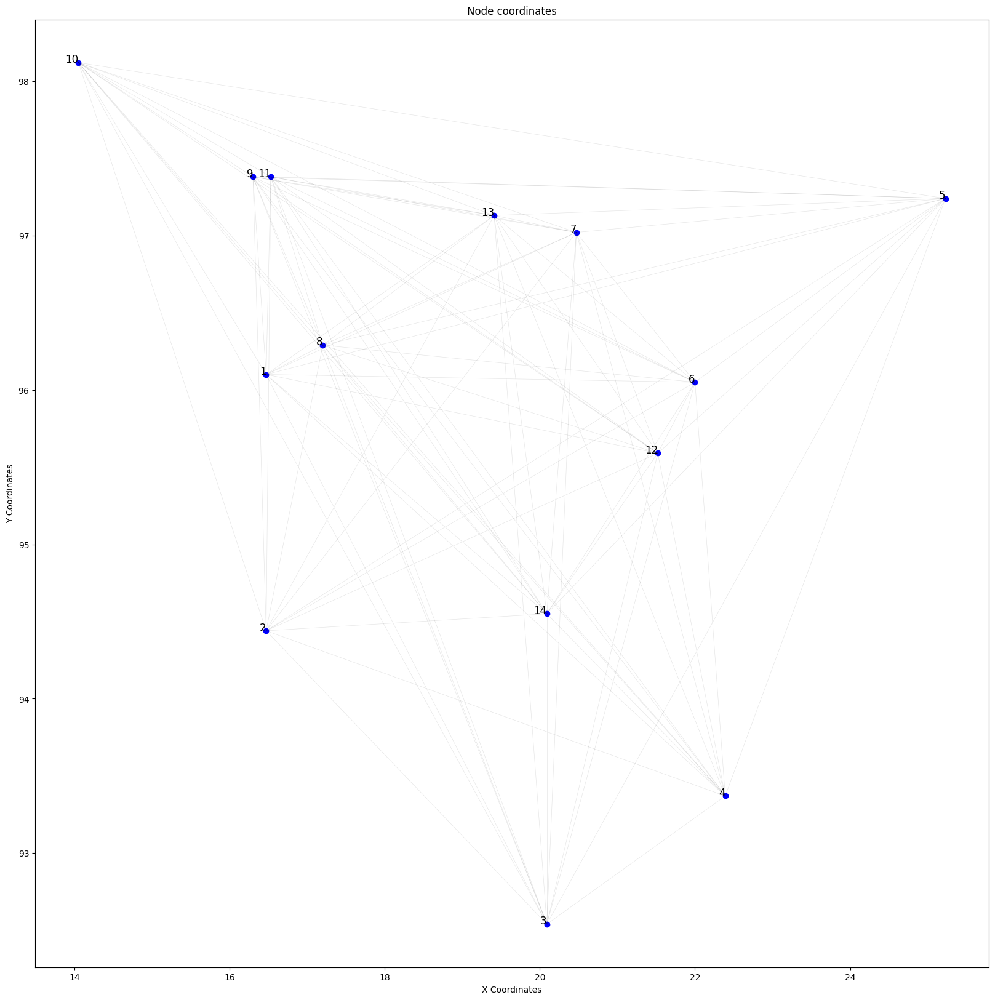

In [110]:
burma14 = TspParser(response.text)
burma14.plotCoords()

### att48

The att48 problem is a lot more complex, covering all 48 capitals of mainland USA. there is a wide distribution of nodes, with many being close together and others being separated significantly. This means that it is the perfect test for the PSO algorithms. It is large enough to pose a challenge for the algorithm, but small enough to be solved in a reasonable amount of time on my hardware.

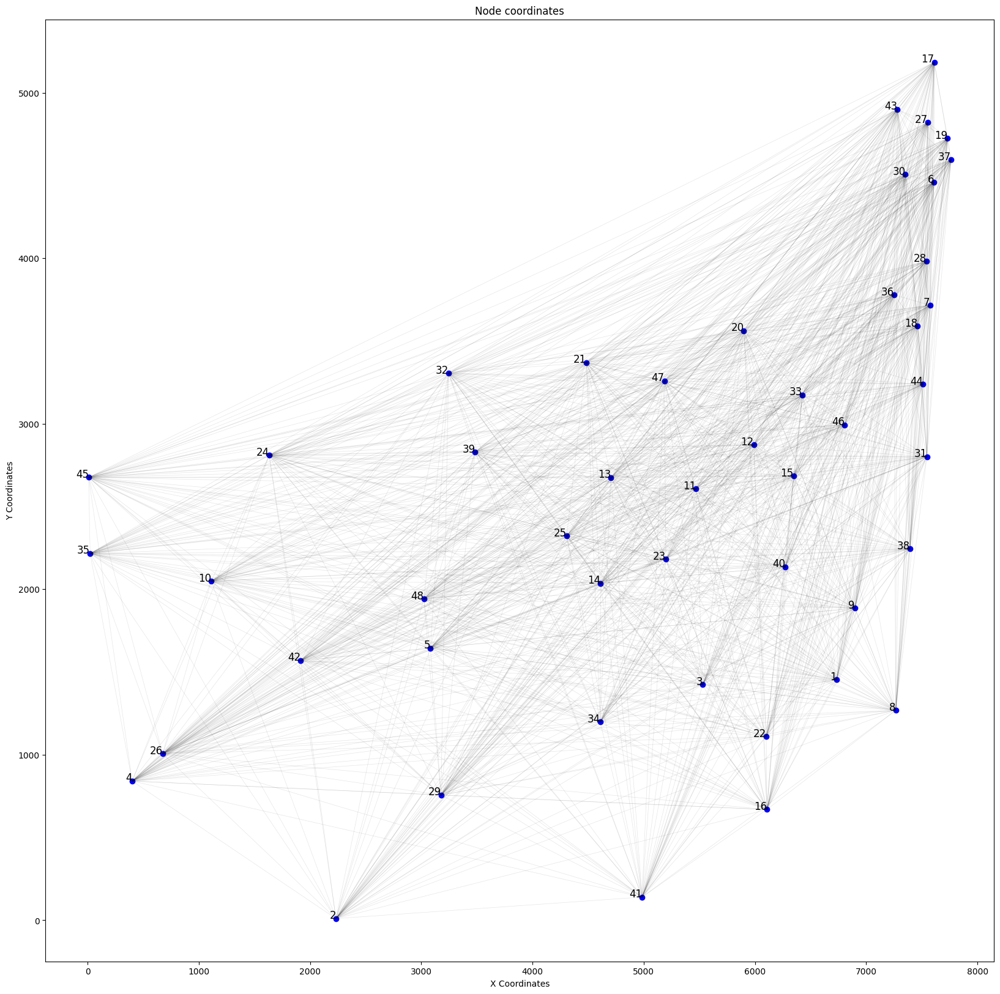

In [ ]:
response = requests.get("https://raw.githubusercontent.com/mastqe/tsplib/refs/heads/master/att48.tsp")
att48 = TspParser(response.text)
att48.plotCoords()

### lin105

lin105 is a significantly larger problem than the others, and is a stretch goal for this project. Hardware and time constraints mean that the algorithms I have cannot solve these without thousands of iterations, which would potentially take hours, so I do not expect my algorithms to come to the optimal solution for this in a reasonable amount of time. The inclusion of this problem is more for comparitive analysis.

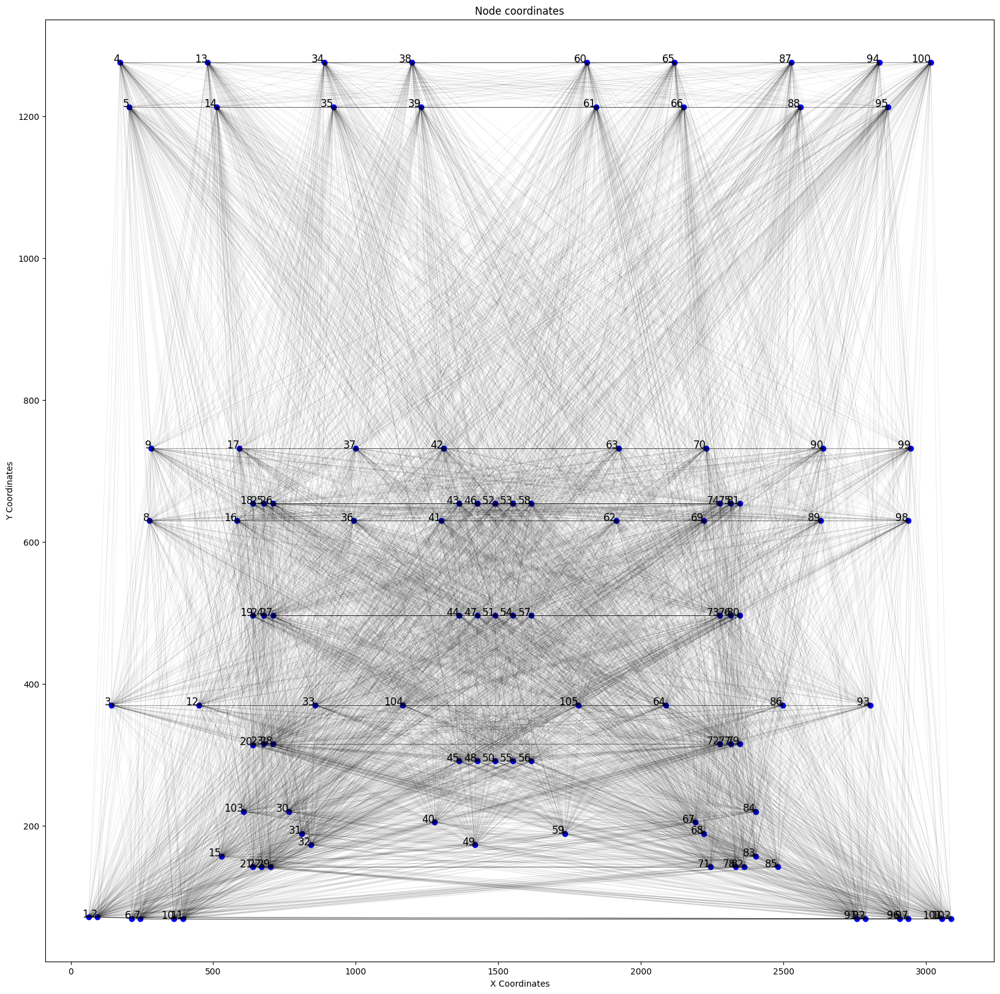

In [107]:
response = requests.get("https://raw.githubusercontent.com/mastqe/tsplib/refs/heads/master/lin105.tsp")
lin105 = TspParser(response.text)
lin105.plotCoords()

## PSO Implementations

### PSO Variant 1 (velocity based swap mutations)

Typically, in the PSO algorithm, there is a velocity component which updates the direction of the particle based on its current position, the local best position, and the global best position. However, for solving the Travelling Salesman Problem we cannot simply update a discrete value.

The approach I took for this problem is shown in this paper. Instead of a typical velocity, I use swap mutations. This involves a sequence of swap operations, represented as an array of arrays of length 2. Each pair indicates 2 indices that will have their values swapped.

In the image below, a swap operation is applied to a list, indicating that item at position 1 is swapped with the item at position 2.  
In the second line, a sequence of swaps is applied. This is the approach that will be taken with this variant of the PSO algorithm.

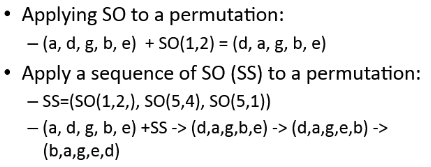[4]

In this approach, the sequence of swaps is kept track of, in the velocity attribute of the particle. It is initialised as a random array of pairs, and updated based on the local best velocity and the global best velocity. There is also a randomisation element to it so that they do not converge on local optima too much. 

Also, instead of initialising the particle's route randomly, it can be done in a greedy way, with an algorithm that quickly takes the shortest possible nodes based on the distance matrix. It obviously does not provide optimal solutions straight away, but they speed up the overall convergence time and result in less iterations needed.

Regarding the parameters, there are several to consider:  
<li>swapCount: the amount of swap operations. In the image above, there are 3 operations, which I made the default option, but this can be changed.</li>
<li>alpha, beta, gamma: these 3 parameters dictate the proportions of how the swap operations are generated. They are generated with respect to the local best, global best, and random.  
In typical implementations, these might also be referred to as inertia, particle cognition, and social influence.</li>

In [112]:
class ParticleV1:
   
    def __init__(self, nodeCount, swapCount=3, greedy=True):
        self.swapCount = swapCount
        self.nodeCount = nodeCount
        if greedy:
            self.greedyInitialisation()
        else:
            self.position = torch.randperm(nodeCount) + 1
        self.fitnessValue = float("inf")
        self.localBestFitnessPosition = self.position.clone() 
        self.localBestFitnessValue = float("inf")
        self.velocity = [torch.randint(0, nodeCount, (2,)) for _ in range(swapCount)]
        self.localBestVelocity = self.velocity
    
    #gets the distance matrix as a static variable
    @staticmethod
    def updateDistanceMatrix(matrix):
        ParticleV1.distanceMatrix = matrix
            
    #calculate length of current route. Goes through every element in position, and uses distance matrix to get edge length
    def calculateRouteLength(self, position):
        tour = position.tolist() 
        totalDistance = sum(ParticleV1.distanceMatrix[tour[i], tour[i+1]] for i in range(len(tour)-1))
        totalDistance += ParticleV1.distanceMatrix[tour[-1], tour[0]]
        return totalDistance
    
    #initialises the particle positions in a greedy way
    def greedyInitialisation(self, k=5):
        nodeCount = ParticleV1.distanceMatrix.shape[0] - 1 
        startNode = torch.randint(1, nodeCount + 1, (1,)).item()
        route = [startNode] 
        unvisited = set(range(1, nodeCount + 1)) - {startNode} 

        currentNode = startNode
        while unvisited:
            distances = ParticleV1.distanceMatrix[currentNode, 1:]  
            nearestNeighbors = sorted([(distances[i], i + 1) for i in range(nodeCount) if (i + 1) in unvisited])[:k]
            nextNode = nearestNeighbors[torch.randint(0, len(nearestNeighbors), (1,)).item()][1]    
            route.append(nextNode)
            unvisited.remove(nextNode)
            currentNode = nextNode

        self.position = torch.tensor(route) 

    #updates velocity (swap sequence) according to the given proportions
    def updateVelocity(self, globalBestVelocity, alpha=1, beta=1, gamma=1):
        maxAttempts = 10
        newVelocity = []

        #calculate what proportions of the new velocity should be generated by the 3 parameters.
        #By default, if swapCount=3, then
        #1 swap will be random, 1 swap will be from the local best, and 1 swap will be from the global best.
        total = alpha + beta + gamma
        alphaCount = round((alpha / total) * self.swapCount)
        betaCount = round((beta / total) * self.swapCount)
        gammaCount = self.swapCount - (alphaCount + betaCount)

        def addSwaps(velocitySource, count_max):
            count = 0
            attempts = 0
            while count < count_max and attempts < maxAttempts:
                swapOperation = velocitySource[torch.randint(0, len(velocitySource), (1,)).item()]
                i, j = swapOperation.tolist()
                newPosition = self.position.clone()
                newPosition[i], newPosition[j] = newPosition[j].clone(), newPosition[i].clone()

                if self.calculateRouteLength(newPosition) < self.calculateRouteLength(self.position):
                    newVelocity.append(swapOperation)
                    count += 1
                attempts += 1
            
            #if attempts get exhausted, then simply add random swaps until filled
            while count < count_max:
                swapOperation = velocitySource[torch.randint(0, len(velocitySource), (1,)).item()]
                newVelocity.append(swapOperation)
                count += 1

        #add the swaps based on beta and gamma
        if betaCount > 0 and len(self.localBestVelocity) > 0:
            addSwaps(self.localBestVelocity, betaCount)
        if gammaCount > 0 and len(globalBestVelocity) > 0:
            addSwaps(globalBestVelocity, gammaCount)
            
        # Add random swaps to fill remaining slots (adding swaps based on alpha parameter)
        attempts = 0
        while len(newVelocity) < self.swapCount and attempts < maxAttempts:
            swapOperation = torch.randint(0, self.nodeCount, (2,))
            i, j = swapOperation.tolist()
            newPosition = self.position.clone()
            newPosition[i], newPosition[j] = newPosition[j].clone(), newPosition[i].clone()

            if self.calculateRouteLength(newPosition) < self.calculateRouteLength(self.position):
                newVelocity.append(swapOperation)
            attempts += 1
        self.velocity = newVelocity
        
    def swapMutation(self):  
        for [i, j] in self.velocity:
            self.position[i], self.position[j] = self.position[j].clone(), self.position[i].clone()

            

In [123]:
class ParticleSwarmOptimiserV1:
    history : dict
    timeTaken: float
        
    def __init__(self, nodeCount, nodeCoordinates, distanceMatrix, particleCount, swapCount, alpha=1, beta=1, gamma=1, greedyInitialisation=True):
        self.nodeCount = nodeCount
        self.nodeCoordinates = nodeCoordinates
        self.distanceMatrix = distanceMatrix
        ParticleV1.updateDistanceMatrix(distanceMatrix)
        self.particleSwarm = [ParticleV1(nodeCount, swapCount=swapCount, greedy=greedyInitialisation) for _ in range(particleCount)]
        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma
        self.globalBestFitnessPosition = self.particleSwarm[0].position.clone()
        self.globalBestFitnessValue = float("inf")
        self.particleCount = particleCount
        self.globalBestVelocity = self.particleSwarm[0].velocity
    
    def getBestSolution(self):
        return self.globalBestFitnessPosition, self.globalBestFitnessValue, self.history, self.timeTaken

    def optimise(self, maxIterations):
        self.timeTaken = 0
        start = time.time()
        self.history = {}
        for iteration in range(maxIterations):
            #print(iteration)

            #iterates over each particle, updating local and global fitness values and routes as needed
            for particle in self.particleSwarm:
                fitness = particle.calculateRouteLength(particle.position)
                particle.fitnessValue = fitness
                if fitness < particle.localBestFitnessValue:
                    particle.localBestFitnessValue = fitness
                    particle.localBestFitnessPosition = particle.position.clone()
                    particle.localBestVelocity = particle.velocity

                if fitness < self.globalBestFitnessValue:
                    self.globalBestFitnessValue = fitness
                    self.globalBestFitnessPosition = particle.position.clone()
                    self.globalBestVelocity = particle.localBestVelocity

            for particle in self.particleSwarm:
                particle.swapMutation()
                particle.updateVelocity(self.globalBestVelocity, self.alpha, self.beta, self.gamma)

            self.history[iteration] = (self.globalBestFitnessPosition, self.globalBestFitnessValue)
        end = time.time()
        self.timeTaken = end - start
    
    #the below methods are just for analysis and visualisation purposes  
    def visualise(self, ax=None):
        plt.figure(figsize=(10, 6))
        if ax is None:        
            ax = plt.gca()
        xCoords = [coord[0] for coord in self.nodeCoordinates.values()]
        yCoords = [coord[1] for coord in self.nodeCoordinates.values()]
        plt.scatter(xCoords, yCoords, c='blue', marker='o', label='Nodes')
        nodeCount = len(self.nodeCoordinates)
        for i in range(1, nodeCount + 1):
            for j in range(i + 1, nodeCount + 1): 
                if self.distanceMatrix[i, j] > 0:
                    x1, y1 = self.nodeCoordinates[i ]
                    x2, y2 = self.nodeCoordinates[j]
                    plt.plot([x1, x2], [y1, y2], 'k-', lw=0.5, alpha=0.1)

        xValues = []
        yValues = []
        bestPath = self.globalBestFitnessPosition.tolist()

        for i in bestPath:
            coords = self.nodeCoordinates[i]
            xValues.append(coords[0])
            yValues.append(coords[1])

        for i in range(len(xValues) - 1):
            plt.plot(xValues[i:i+2], yValues[i:i+2], 'ro-', markersize=5, label='Best Path' if i == 0 else "")
        plt.plot([xValues[-1], xValues[0]], [yValues[-1], yValues[0]], 'ro-', markersize=5)
        plt.xlabel('X Coordinates')
        plt.ylabel('Y Coordinates')
        plt.title('Node Coordinates')
        plt.legend()
        plt.show() 
        
    def showIterationHistory(self, ax=None):
        table_data = []
        for iteration, (position, value) in self.history.items():
            if iteration % 10 == 0 or iteration == len(self.history)-1:
                position_list = position.tolist() 
                value = value.item()
                table_data.append([iteration, position_list, value])
        df = pd.DataFrame(table_data, columns=["Iteration", "Position", "Value"])
        
        if ax is None:
            fig, ax = plt.subplots(figsize=(15, 6))
        ax.axis('off')
        table = ax.table(cellText=df.values, loc='center', colWidths=[0.1, 0.7, 0.1], cellLoc='center', colColours=["lightgrey"]*df.shape[1])

        table.auto_set_font_size(False)
        table.set_fontsize(10)
        table.scale(1.5, 1.5) 
        plt.show()
        
    def showLossAgainstIterationGraph(self):
        iterations = []
        values = []
        for iteration, (position, value) in self.history.items():
            values.append(value.item())
            iterations.append(iteration)

        plt.figure(figsize=(10, 6))
        plt.plot(iterations, values, marker='o', color='b', label='Fitness Value')
        plt.xlabel('Iteration')
        plt.ylabel('Value')
        plt.title('Iteration vs Value')
        plt.grid(True)
        plt.legend()
        plt.show()
        

## PSO variant 2 (genetic inspired segment reinsertion)

The third variant is inspired by [2]. This paper goes through the use of genetic crossover operations on the particle paths. Instead of directly implementing crossover mutations, I implemented a segment reinsertion method that takes entire segments from the current, local best, and global best, and strategically combines these into a brand new path.

Example:  
Given that we have Current Path: [A, B, C, D, E]  
and Global Best: [E, B, D, C, A]  

The algorithm will extract a random segment from global best, such as [D, C, A], and insert this into the current path, which will create a new, potentially improved path:  
[B, D, C, A, E] 

This maintains good structures from better solutions and inserts them into our current path.  
In practice, I implemented segment insertions from the local best, global best, and randomly, where the importance of each of these can be controlled with hyperparameters alpha, beta, gamma.

In [114]:
class ParticleV2:
   
    def __init__(self, nodeCount, swapCount=3, greedy=True):
        self.swapCount = swapCount
        self.nodeCount = nodeCount
        if greedy:
            self.greedyInitialisation()
        else:
            self.position = torch.randperm(nodeCount) + 1
        self.fitnessValue = float("inf")
        self.localBestFitnessPosition = self.position.clone() 
        self.localBestFitnessValue = float("inf")
    
    @staticmethod
    def updateDistanceMatrix(matrix):
        ParticleV2.distanceMatrix = matrix
            
    #calculate length of current route. Goes through every element in position, and uses distance matrix to get edge length
    def calculateRouteLength(self, position):
        tour = position.tolist() 
        totalDistance = sum(ParticleV2.distanceMatrix[tour[i], tour[i+1]] for i in range(len(tour)-1))
        totalDistance += ParticleV2.distanceMatrix[tour[-1], tour[0]]
        return totalDistance
    
    #initialises the particle positions in a greedy way
    def greedyInitialisation(self, k=5):
        nodeCount = ParticleV2.distanceMatrix.shape[0] - 1 
        startNode = torch.randint(1, nodeCount + 1, (1,)).item()
        route = [startNode] 
        unvisited = set(range(1, nodeCount + 1)) - {startNode} 

        currentNode = startNode
        while unvisited:
            distances = ParticleV2.distanceMatrix[currentNode, 1:]  
            nearestNeighbors = sorted([(distances[i], i + 1) for i in range(nodeCount) if (i + 1) in unvisited])[:k]
            nextNode = nearestNeighbors[torch.randint(0, len(nearestNeighbors), (1,)).item()][1]    
            route.append(nextNode)
            unvisited.remove(nextNode)
            currentNode = nextNode

        self.position = torch.tensor(route) 

    #similarly to V1, calculate what proportions should be generated by the 3 parameters.
    def swapMutation(self, globalBestPath, alpha=1, beta=1, gamma=1):  
        newPosition = self.position.tolist() 
        innerCount = 0
        foundBetter = False

        total = alpha + beta + gamma
        alphaCount = round((alpha / total) * self.swapCount)
        betaCount = round((beta / total) * self.swapCount)
        gammaCount = self.swapCount - (alphaCount + betaCount)

        def extractAndInsertSegment(sourcePath):
            segmentLength = torch.randint(1, max(2, self.nodeCount // 4), (1,)).item()
            startIdx = torch.randint(0, self.nodeCount - segmentLength, (1,)).item()
            segment = sourcePath[startIdx:startIdx + segmentLength]
            tempPosition = [node for node in newPosition if node not in segment]
            insertIdx = torch.randint(0, len(tempPosition) + 1, (1,)).item()
            tempPosition[insertIdx:insertIdx] = segment
        
            return tempPosition

        #repeatedly do segment reinsertion according to the proportions given
        while not foundBetter and innerCount < 10:
            candidates = []
            for _ in range(alphaCount):
                candidates.append(extractAndInsertSegment(self.position))
            for _ in range(betaCount):
                candidates.append(extractAndInsertSegment(self.localBestFitnessPosition))
            for _ in range(gammaCount):
                candidates.append(extractAndInsertSegment(globalBestPath))

            bestCandidate = min(
                (torch.tensor(c, dtype=torch.long) for c in candidates),
                key=lambda pos: self.calculateRouteLength(pos)
            )

            if self.calculateRouteLength(bestCandidate) < self.calculateRouteLength(self.position):
                self.position = bestCandidate.clone()
                foundBetter = True
            innerCount += 1


In [124]:
class ParticleSwarmOptimiserV2:
    history : dict
    timeTaken: float
        
    def __init__(self, nodeCount, nodeCoordinates, distanceMatrix, particleCount, swapCount, alpha=1, beta=1, gamma=1, greedyInitialisation=True):
        self.nodeCount = nodeCount
        self.nodeCoordinates = nodeCoordinates
        self.distanceMatrix = distanceMatrix
        ParticleV2.updateDistanceMatrix(distanceMatrix)
        self.particleSwarm = [ParticleV2(nodeCount, swapCount=swapCount, greedy=greedyInitialisation) for _ in range(particleCount)]
        self.beta = beta
        self.alpha = alpha
        self.gamma = gamma
        self.globalBestFitnessPosition = self.particleSwarm[0].position.clone()
        self.globalBestFitnessValue = float("inf")
        self.particleCount = particleCount
    
    def getBestSolution(self):
        return self.globalBestFitnessPosition, self.globalBestFitnessValue, self.history, self.timeTaken

    def optimise(self, maxIterations):
        self.timeTaken = 0
        start = time.time()
        self.history = {}

        #again, iterate over each particle and update the local and global bests accordingly
        for iteration in range(maxIterations):
            #print(iteration)
            for particle in self.particleSwarm:
                fitness = particle.calculateRouteLength(particle.position)
                particle.fitnessValue = fitness
                if fitness < particle.localBestFitnessValue:
                    particle.localBestFitnessValue = fitness
                    particle.localBestFitnessPosition = particle.position.clone()

                if fitness < self.globalBestFitnessValue:
                    self.globalBestFitnessValue = fitness
                    self.globalBestFitnessPosition = particle.position.clone()

            for particle in self.particleSwarm:
                particle.swapMutation(self.globalBestFitnessPosition, self.alpha, self.beta, self.gamma)

            self.history[iteration] = (self.globalBestFitnessPosition, self.globalBestFitnessValue)
        end = time.time()
        self.timeTaken = end - start
        
    #methods for analysis and visualisation
    def visualise(self, ax=None):
        plt.figure(figsize=(10, 6))
        if ax is None:        
            ax = plt.gca()
        xCoords = [coord[0] for coord in self.nodeCoordinates.values()]
        yCoords = [coord[1] for coord in self.nodeCoordinates.values()]
        plt.scatter(xCoords, yCoords, c='blue', marker='o', label='Nodes')
        nodeCount = len(self.nodeCoordinates)
        for i in range(1, nodeCount + 1):
            for j in range(i + 1, nodeCount + 1): 
                if self.distanceMatrix[i, j] > 0:
                    x1, y1 = self.nodeCoordinates[i ]
                    x2, y2 = self.nodeCoordinates[j]
                    plt.plot([x1, x2], [y1, y2], 'k-', lw=0.5, alpha=0.1)

        xValues = []
        yValues = []
        bestPath = self.globalBestFitnessPosition.tolist()

        for i in bestPath:
            coords = self.nodeCoordinates[i]
            xValues.append(coords[0])
            yValues.append(coords[1])

        for i in range(len(xValues) - 1):
            plt.plot(xValues[i:i+2], yValues[i:i+2], 'ro-', markersize=5, label='Best Path' if i == 0 else "")
        plt.plot([xValues[-1], xValues[0]], [yValues[-1], yValues[0]], 'ro-', markersize=5)
        plt.xlabel('X Coordinates')
        plt.ylabel('Y Coordinates')
        plt.title('Node Coordinates')
        plt.legend()
        plt.show() 
        
    def showIterationHistory(self, ax=None):
        table_data = []
        for iteration, (position, value) in self.history.items():
            if iteration % 10 == 0 or iteration == len(self.history)-1:
                position_list = position.tolist() 
                value = value.item()
                table_data.append([iteration, position_list, value])
        df = pd.DataFrame(table_data, columns=["Iteration", "Position", "Value"])
        
        if ax is None:
            fig, ax = plt.subplots(figsize=(15, 6))
        ax.axis('off')
        table = ax.table(cellText=df.values, loc='center', colWidths=[0.1, 0.7, 0.1], cellLoc='center', colColours=["lightgrey"]*df.shape[1])

        table.auto_set_font_size(False)
        table.set_fontsize(10)
        table.scale(1.5, 1.5) 
        plt.show()
        
    def showLossAgainstIterationGraph(self):
        iterations = []
        values = []
        for iteration, (position, value) in self.history.items():
            values.append(value.item())
            iterations.append(iteration)

        plt.figure(figsize=(10, 6))
        plt.plot(iterations, values, marker='o', color='b', label='Fitness Value')
        plt.xlabel('Iteration')
        plt.ylabel('Value')
        plt.title('Iteration vs Value')
        plt.grid(True)
        plt.legend()
        plt.show()


## Analysis

For the analysis, I made a some functions to draw the solutions and graphs of losses over time, so that the metrics of each variant can be compared, as well as the solutions that they generate.

In [105]:
#function to plot best paths found from both variants
def compareBestRoutes(psoV1, psoV2):
    plt.figure(figsize=(10, 6))
    ax = plt.gca()

    xCoords = [coord[0] for coord in psoV1.nodeCoordinates.values()]
    yCoords = [coord[1] for coord in psoV1.nodeCoordinates.values()]
    ax.scatter(xCoords, yCoords, c='blue', marker='o', label='Nodes')

    def plotBestPath(pso, color, linestyle, offset, label):
        bestPath = pso.globalBestFitnessPosition.tolist()

        xValues = [pso.nodeCoordinates[i][0] + offset for i in bestPath]
        yValues = [pso.nodeCoordinates[i][1] + offset for i in bestPath]

        ax.plot(xValues, yValues, linestyle, color=color, markersize=5, alpha=0.8, label=label)
        ax.plot([xValues[-1], xValues[0]], [yValues[-1], yValues[0]], linestyle, color=color, markersize=5, alpha=0.8)
    plotBestPath(psoV1, 'r', 'o-', 0.01, 'Best Path (Variant 1)')
    plotBestPath(psoV2, 'g', 'o--', -0.01, 'Best Path (Variant 2)') 

    ax.set_xlabel('X Coordinates')
    ax.set_ylabel('Y Coordinates')
    ax.set_title('Comparison of Best Paths')
    ax.legend()
    plt.show()

#function to plot both curves of loss against iterations
def compareLossCurves(psoV1, psoV2):
    plt.figure(figsize=(10, 6))

    def extractLossData(pso):
        iterations = []
        values = []
        for iteration, (_, value) in pso.history.items():
            iterations.append(iteration)
            values.append(value.item())
        return iterations, values

    iterations1, values1 = extractLossData(psoV1)
    iterations2, values2 = extractLossData(psoV2)
    plt.plot(iterations1, values1, marker='o', linestyle='-', color='r', label='Variant 1')
    plt.plot(iterations2, values2, marker='s', linestyle='--', color='g', label='Variant 2')

    plt.xlabel('Iteration')
    plt.ylabel('Fitness Value')
    plt.title('Comparison of Fitness Value over Iterations')
    plt.grid(True)
    plt.legend()
    plt.show()

### burma14 Analysis

#### Initial comparison <a name="Initial-Comparison-1"></a>

##### V1 <a name="V1-1"></a>

First I ran V1 on this problem, with some simple parameters:


Best Path Found: [10, 9, 11, 1, 8, 13, 7, 6, 5, 12, 4, 3, 14, 2]
Best Cost: tensor(32.2441)
time taken: 4.661736726760864


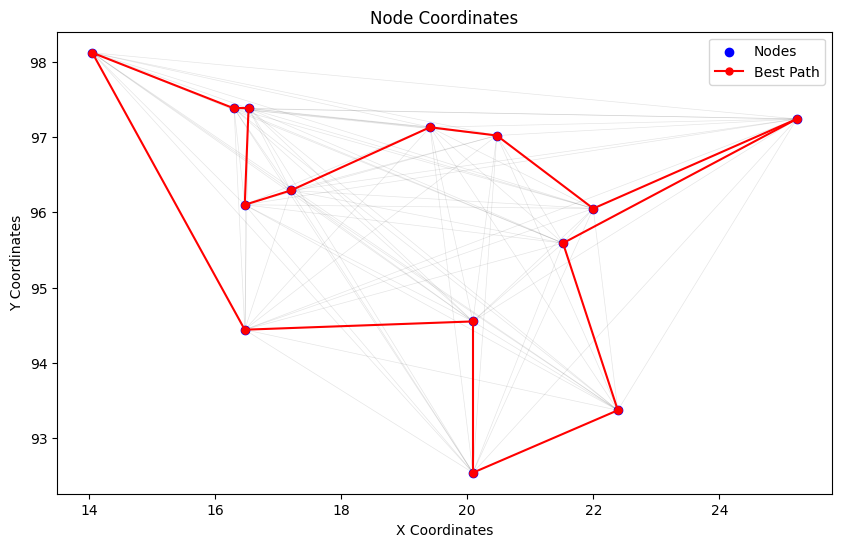

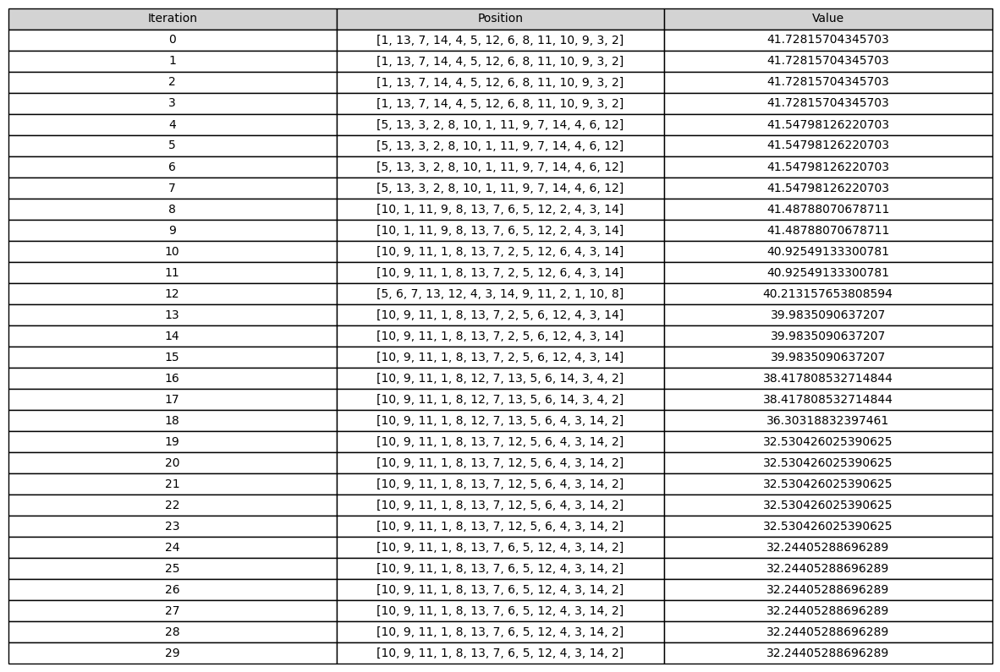

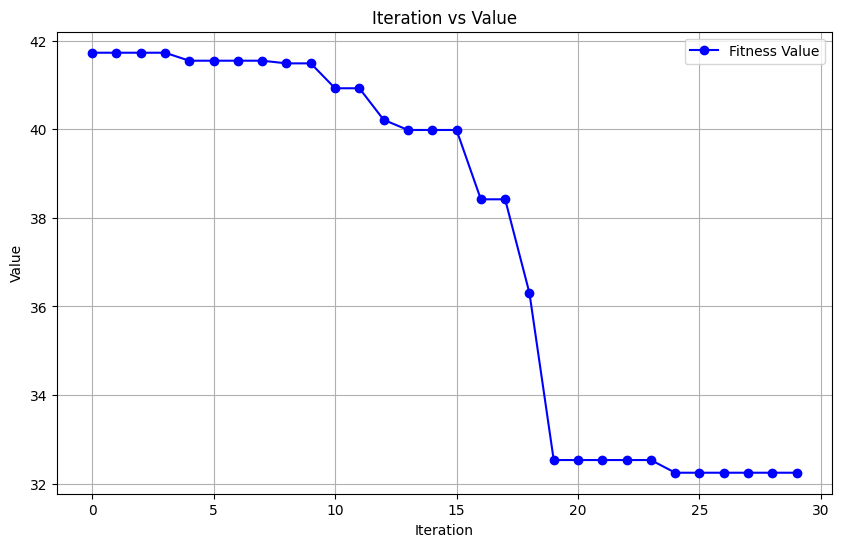

In [ ]:
particleCount = 10
maxIterations = 30

psoV1 = ParticleSwarmOptimiserV1(
    nodeCount=burma14.dimension,
    nodeCoordinates = burma14.nodeCoordinates,
    distanceMatrix = burma14.distanceMatrix,
    particleCount=particleCount,
    swapCount = 3,
    alpha = 1,
    beta = 1,
    gamma = 1,
    greedyInitialisation = True
)

psoV1.optimise(maxIterations)
bestPathV1, bestCostV1, historyV1, timeTakenV1 = psoV1.getBestSolution()

print("\nBest Path Found:", bestPathV1.tolist())
print("Best Cost:", bestCostV1)
print(f"time taken: {timeTakenV1}")
psoV1.visualise()
psoV1.showIterationHistory()
psoV1.showLossAgainstIterationGraph()

##### V2 <a name="V2-1"></a>

Then I ran V2 on this problem with the exact same parameters:


Best Path Found: [5, 4, 3, 14, 2, 1, 10, 9, 11, 8, 13, 7, 12, 6]
Best Cost: tensor(30.8785)
time taken: 6.01154899597168


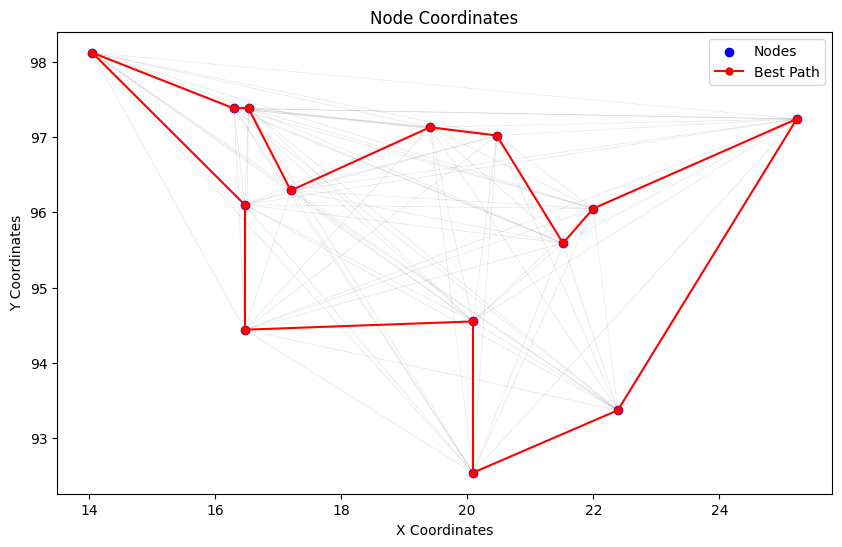

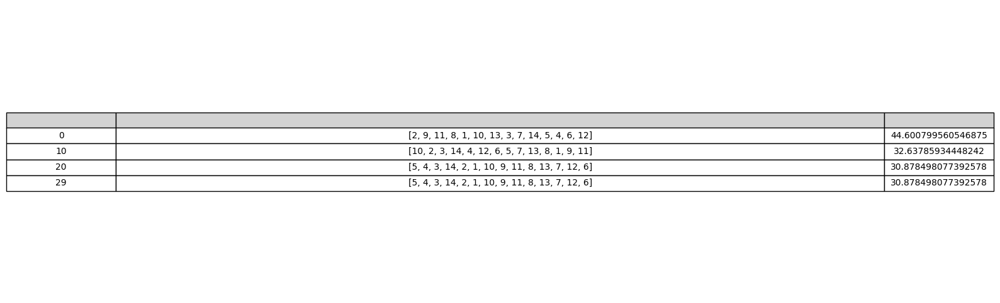

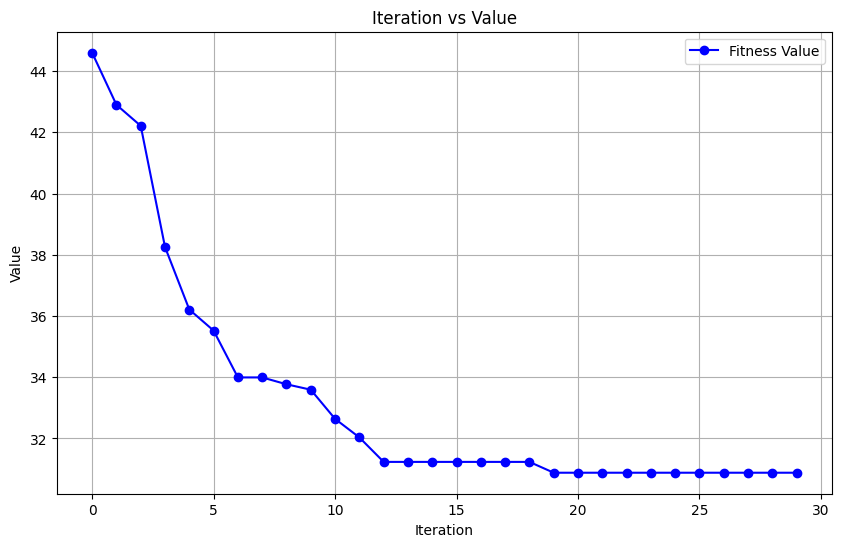

In [125]:
particle_count = 10
max_iterations = 30
alpha = 1
beta = 1
gamma = 1

psoV2 = ParticleSwarmOptimiserV2(
    nodeCount=burma14.dimension,
    nodeCoordinates = burma14.nodeCoordinates,
    distanceMatrix = burma14.distanceMatrix,
    particleCount=particle_count,
    swapCount = 3,
    alpha = alpha,
    beta = beta,
    gamma = gamma,
    greedyInitialisation = True
)

psoV2.optimise(max_iterations)
bestPathV2, bestCostV2, historyV2, timeTakenV2 = psoV2.getBestSolution()

print("\nBest Path Found:", bestPathV2.tolist())
print("Best Cost:", bestCostV2)
print(f"time taken: {timeTakenV2}")
psoV2.visualise()
psoV2.showIterationHistory()
psoV2.showLossAgainstIterationGraph()

##### Comparing Results <a name="Comparing-Results-1"></a>

If we compare the results, we can see that variant 2 performs better and faster.

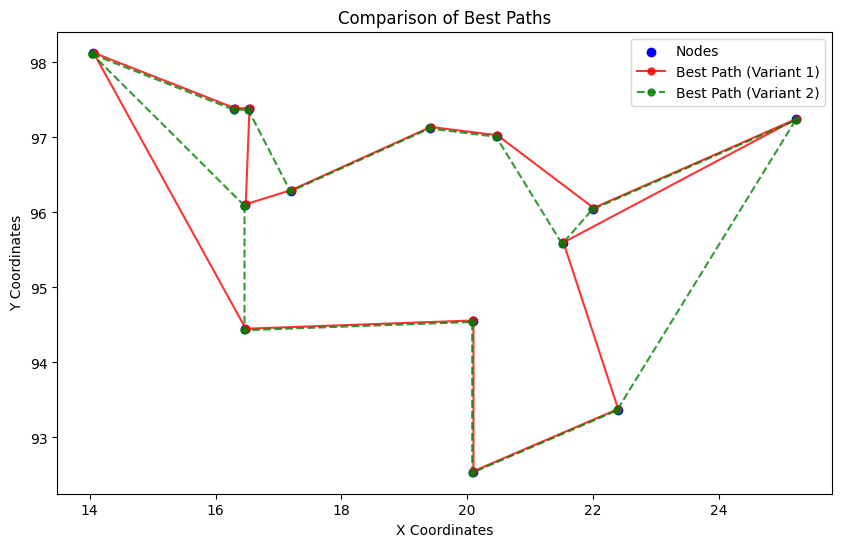

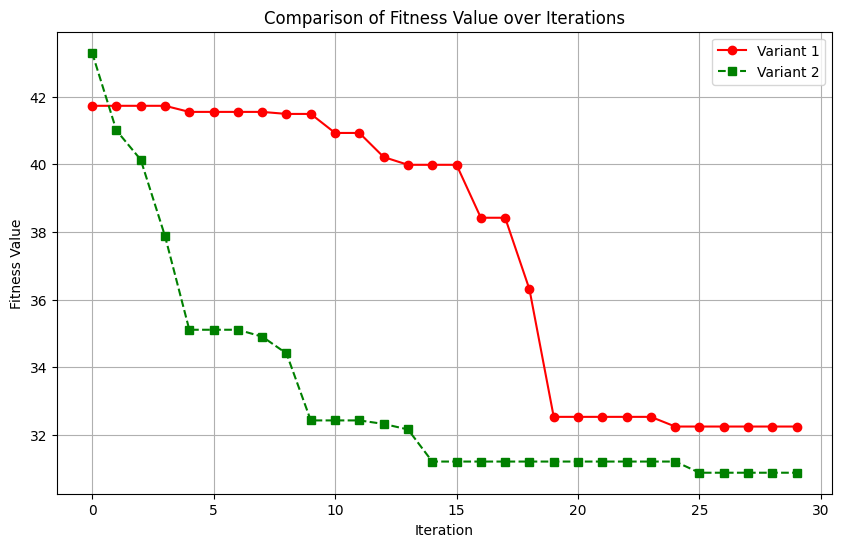

In [74]:
compareBestRoutes(psoV1, psoV2)
compareLossCurves(psoV1, psoV2)

Tune hyperparameters and discuss why we do what we do.

Then discuss the results of the tuned hyperparameters.

#### Comparison after tuning parameters <a name="Comparison-after-tuning-parameters-1"></a>

I then decided to tune the parameters of each to see how each were impacted.

##### V1 <a name="V1-2"></a>

I first allowed greedy initialisation. I also increased the amount of iterations, and the amount of swaps. Based on the past performance, it spends more time exploring before exploiting towards the end, so to enhance exploitation I increased the gamma value.


Best Path Found: [2, 10, 9, 11, 1, 8, 13, 7, 12, 6, 5, 4, 3, 14]
Best Cost: tensor(31.2269)
time taken: 11.069800615310669


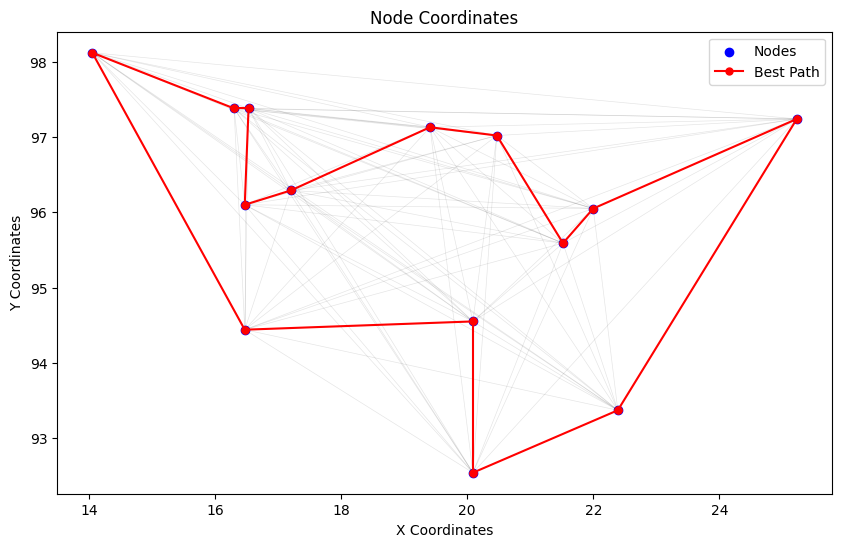

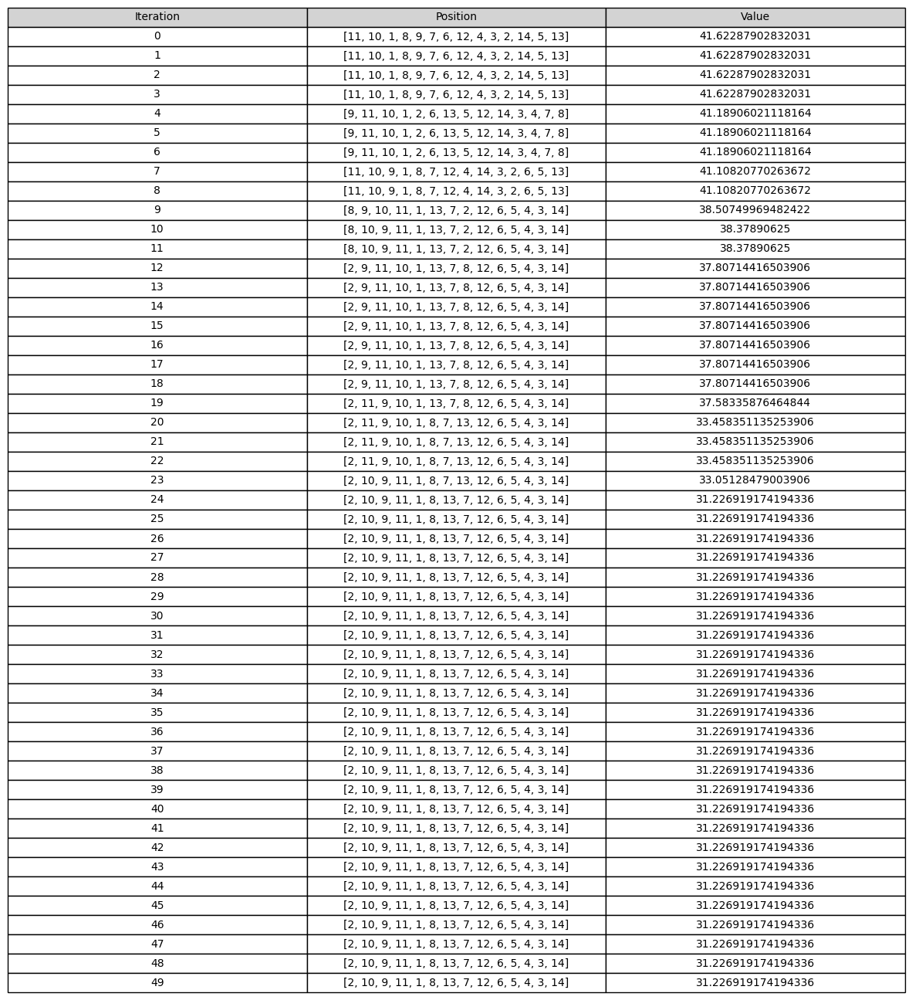

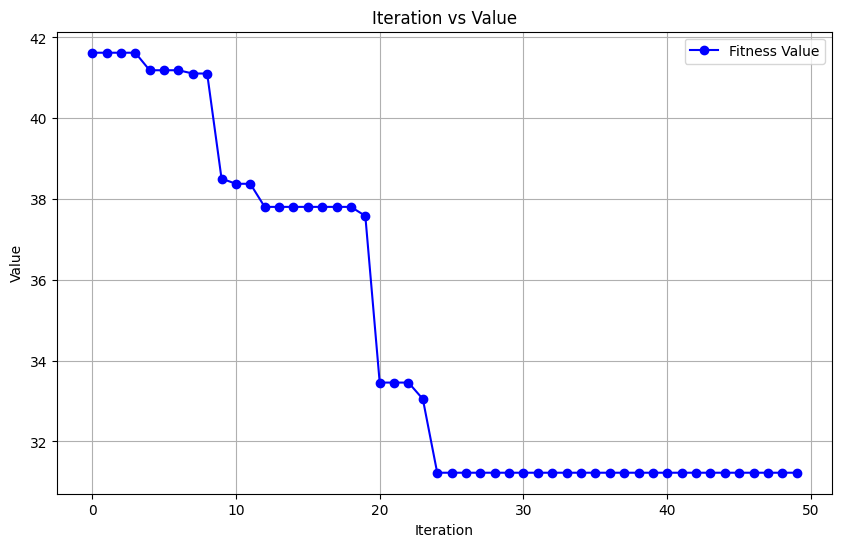

In [81]:
particleCount = 15
maxIterations = 50

psoV1 = ParticleSwarmOptimiserV1(
    nodeCount=burma14.dimension,
    nodeCoordinates = burma14.nodeCoordinates,
    distanceMatrix = burma14.distanceMatrix,
    particleCount=particleCount,
    swapCount = 5,
    alpha = 1,
    beta = 1,
    gamma = 2,
    greedyInitialisation = True
)

psoV1.optimise(maxIterations)
bestPathV1, bestCostV1, historyV1, timeTakenV1 = psoV1.getBestSolution()

print("\nBest Path Found:", bestPathV1.tolist())
print("Best Cost:", bestCostV1)
print(f"time taken: {timeTakenV1}")
psoV1.visualise()
psoV1.showIterationHistory()
psoV1.showLossAgainstIterationGraph()

##### V2 <a name="V2-2"></a>

In the initial run, this variant managed to achieve the optimal solution, so I was interested to see how it could be optimised further. I decreased the amount of iterations to 20 and increased the amount of swaps to 5, and was able to reach the optimal solution in less iterations than before. However, it took approximately double the time due to the increased swaps.


Best Path Found: [13, 8, 11, 9, 10, 1, 2, 14, 3, 4, 5, 6, 12, 7]
Best Cost: tensor(30.8785)
time taken: 6.641398191452026


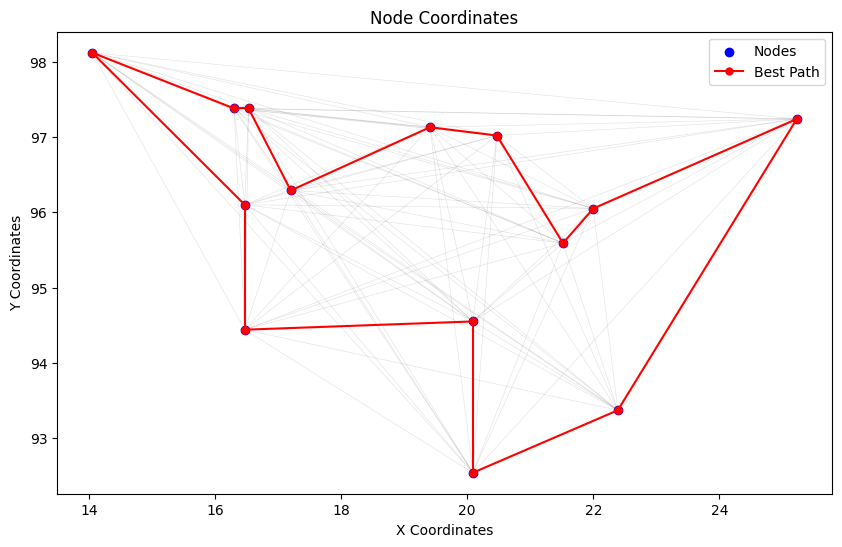

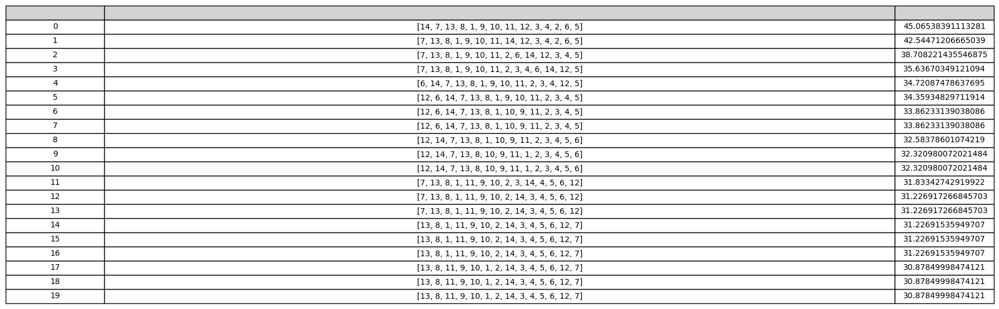

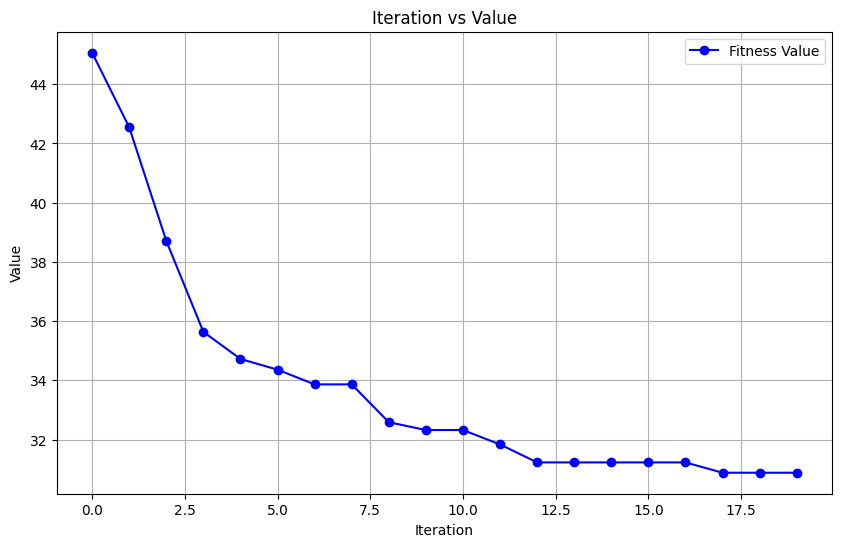

In [119]:
particle_count = 10
max_iterations = 20
alpha = 1
beta = 1
gamma = 1

psoV2 = ParticleSwarmOptimiserV2(
    nodeCount=burma14.dimension,
    nodeCoordinates = burma14.nodeCoordinates,
    distanceMatrix = burma14.distanceMatrix,
    particleCount=particle_count,
    swapCount = 5,
    alpha = alpha,
    beta = beta,
    gamma = gamma,
    greedyInitialisation = True
)

psoV2.optimise(max_iterations)
bestPathV2, bestCostV2, historyV2, timeTakenV2 = psoV2.getBestSolution()

print("\nBest Path Found:", bestPathV2.tolist())
print("Best Cost:", bestCostV2)
print(f"time taken: {timeTakenV2}")
psoV2.visualise()
psoV2.showIterationHistory()
psoV2.showLossAgainstIterationGraph()

##### Comparing Results <a name="Comparing-Results-2"></a>

It is evident that V2 is significantly better than V1 in all aspects. Even with increased iterations, particles, and swaps, V1 does not reach the optimal solution. V2 reaches the optimal solution faster, with less iterations and less computational resources used.

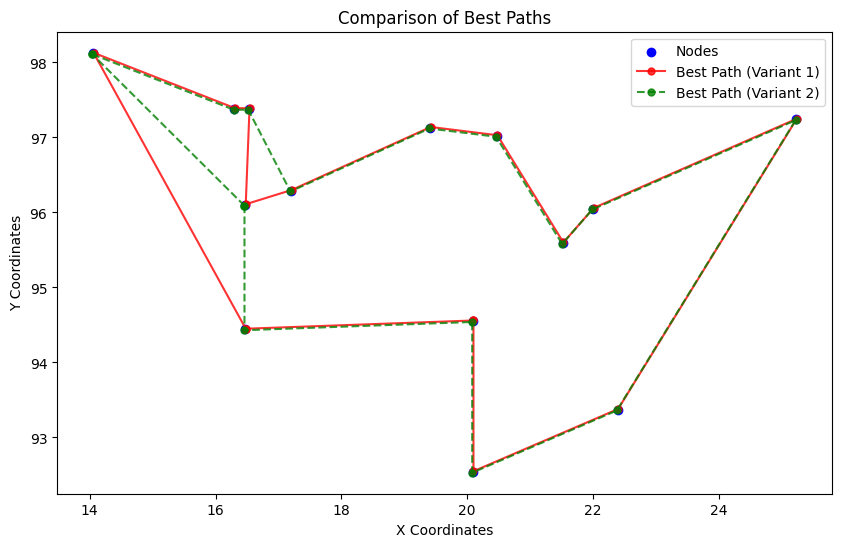

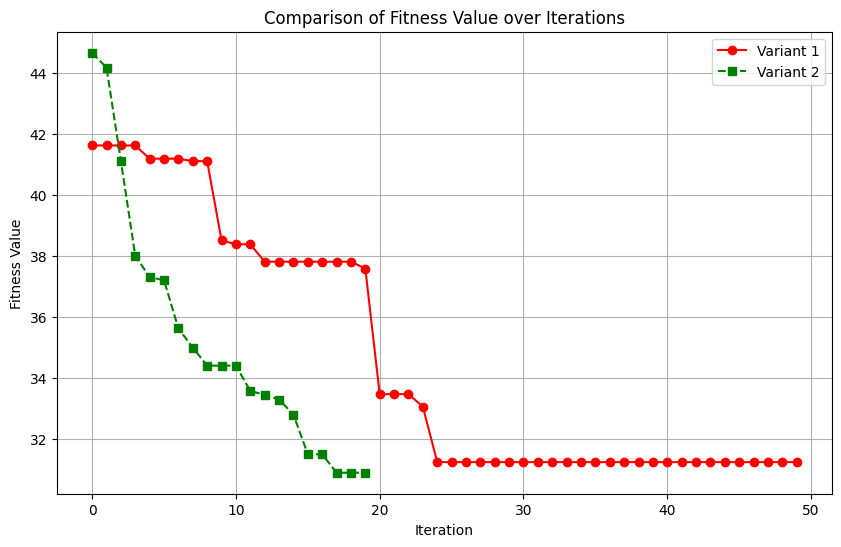

In [82]:
compareBestRoutes(psoV1, psoV2)
compareLossCurves(psoV1, psoV2)

### att48 Analysis

#### Initial comparison <a name="Initial-Comparison-2"></a>

##### V1 <a name="V1-3"></a>

Using default parameters


Best Path Found: [23, 47, 13, 25, 34, 16, 22, 8, 33, 20, 44, 46, 36, 28, 18, 30, 17, 43, 6, 37, 19, 27, 7, 31, 38, 3, 41, 14, 42, 48, 5, 29, 2, 4, 45, 35, 26, 10, 24, 32, 21, 39, 15, 9, 1, 11, 12, 40]
Best Cost: tensor(51239.3359)
time taken: 16.50007915496826


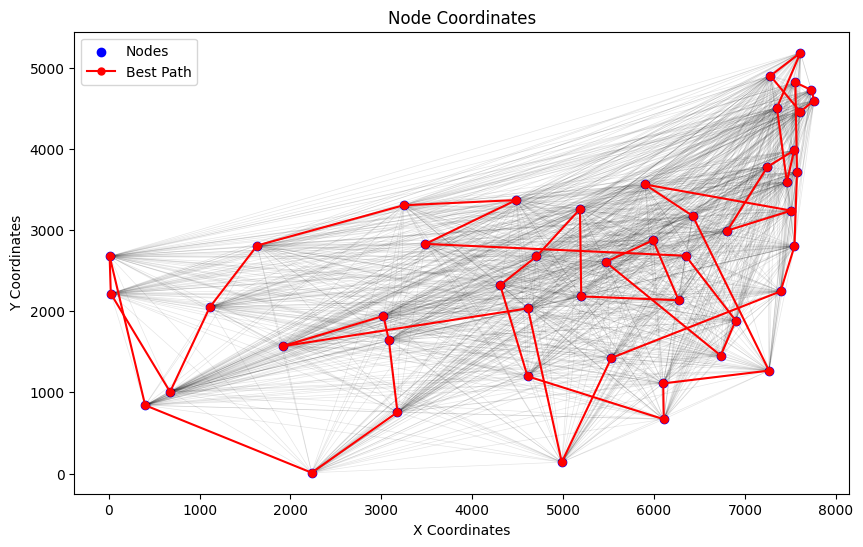

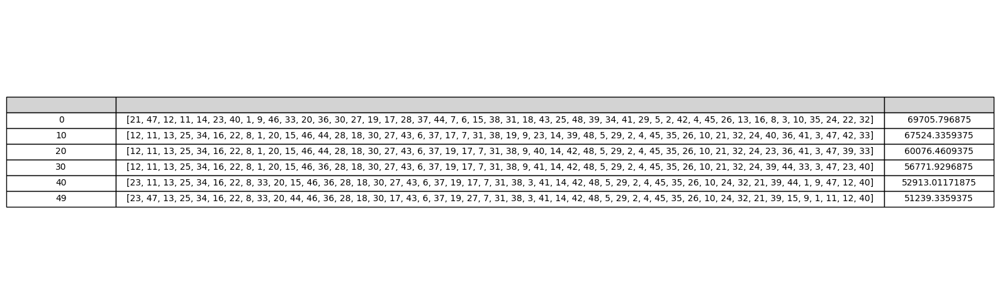

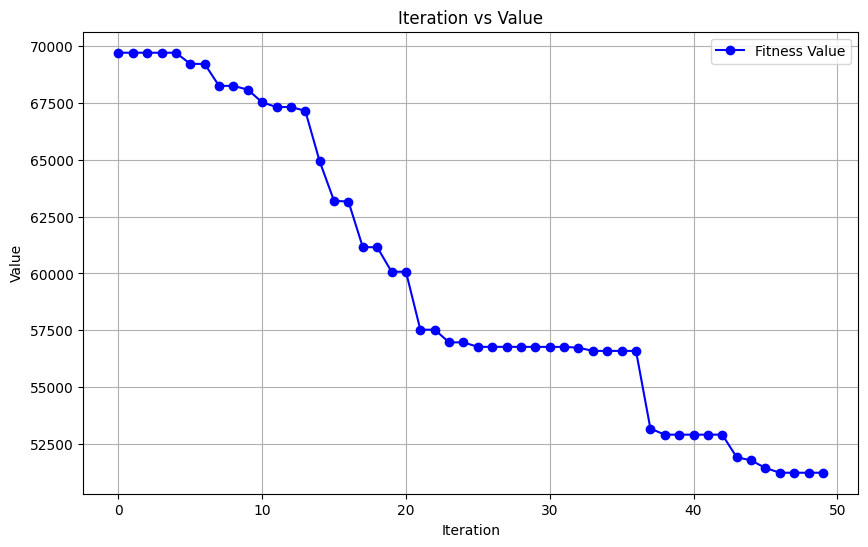

In [126]:
particleCount = 10
maxIterations = 50

psoV1 = ParticleSwarmOptimiserV1(
    nodeCount=att48.dimension,
    nodeCoordinates = att48.nodeCoordinates,
    distanceMatrix = att48.distanceMatrix,
    particleCount=particleCount,
    swapCount = 3,
    alpha = 1,
    beta = 1,
    gamma = 1,
    greedyInitialisation = True
)

psoV1.optimise(maxIterations)
bestPathV1, bestCostV1, historyV1, timeTakenV1 = psoV1.getBestSolution()

print("\nBest Path Found:", bestPathV1.tolist())
print("Best Cost:", bestCostV1)
print(f"time taken: {timeTakenV1}")
psoV1.visualise()
psoV1.showIterationHistory()
psoV1.showLossAgainstIterationGraph()

##### V2 <a name="V2-3"></a>

Also with default parameters


Best Path Found: [31, 44, 46, 15, 40, 9, 8, 1, 12, 20, 21, 13, 11, 33, 18, 36, 7, 37, 19, 6, 43, 30, 17, 38, 28, 27, 23, 14, 34, 25, 48, 39, 5, 2, 26, 42, 35, 4, 45, 32, 47, 16, 3, 41, 24, 10, 22, 29]
Best Cost: tensor(69311.6094)
time taken: 0.39290404319763184


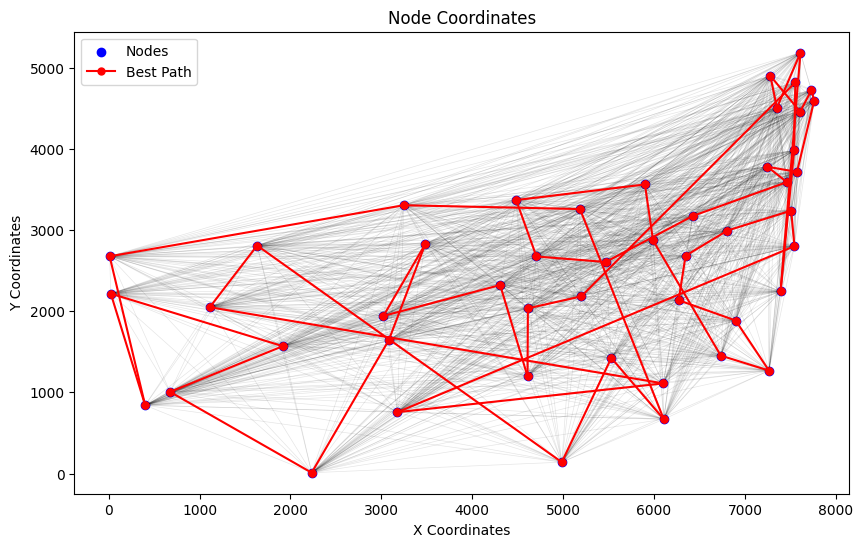

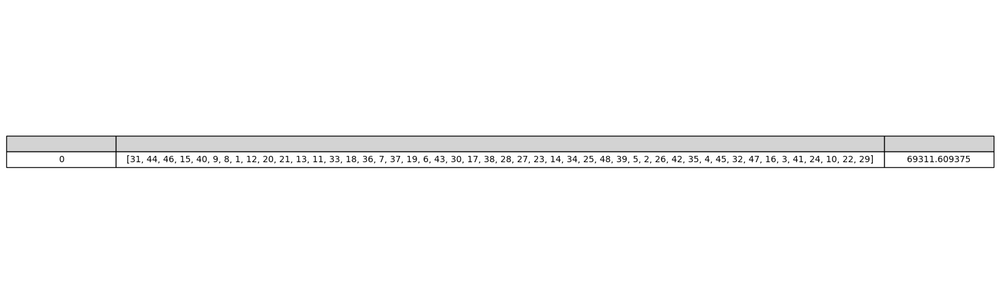

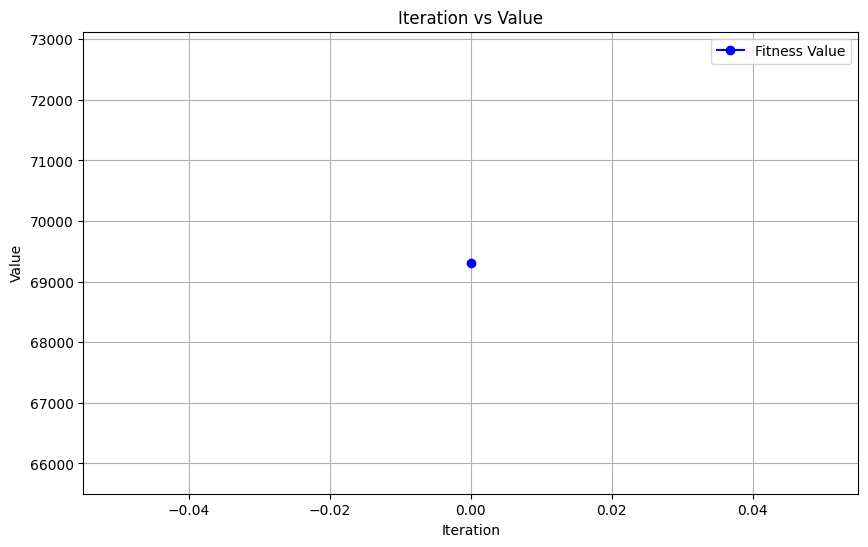

In [127]:
particleCount = 10
maxIterations = 1

psoV2 = ParticleSwarmOptimiserV2(
    nodeCount=att48.dimension,
    nodeCoordinates = att48.nodeCoordinates,
    distanceMatrix = att48.distanceMatrix,
    particleCount=particleCount,
    swapCount = 3,
    alpha = 1,
    beta = 1,
    gamma = 1,
    greedyInitialisation = True
)

psoV2.optimise(maxIterations)
bestPathV2, bestCostV2, historyV2, timeTakenV2 = psoV2.getBestSolution()

print("\nBest Path Found:", bestPathV2.tolist())
print("Best Cost:", bestCostV2)
print(f"time taken: {timeTakenV2}")
psoV2.visualise()
psoV2.showIterationHistory()
psoV2.showLossAgainstIterationGraph()

##### Comparing Results <a name="Comparing-Results-3"></a>

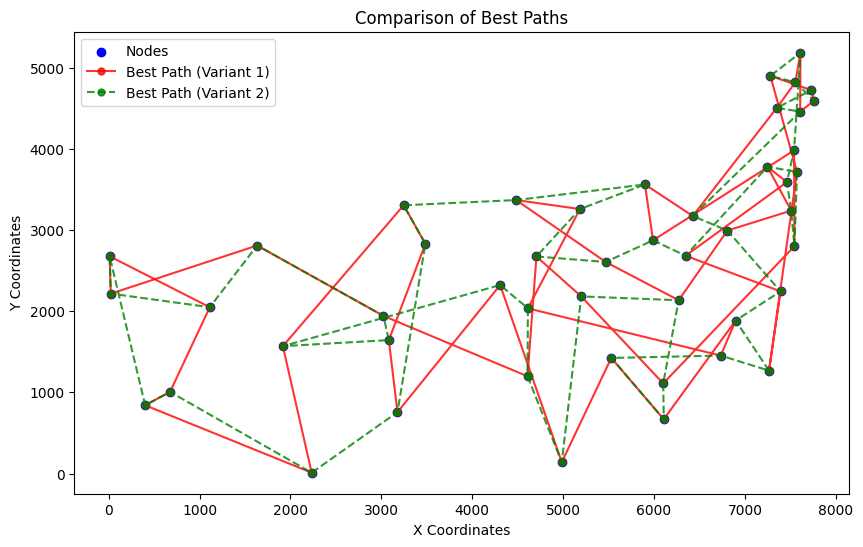

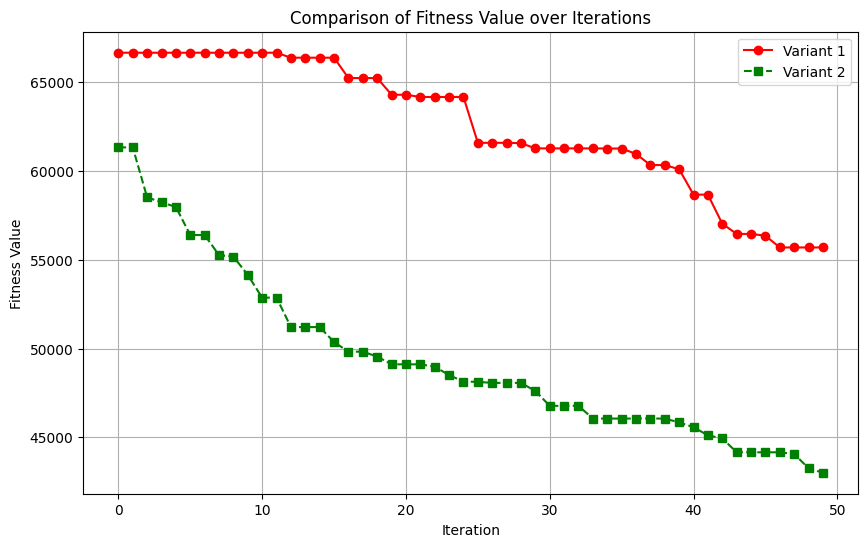

In [ ]:
compareBestRoutes(psoV1, psoV2)
compareLossCurves(psoV1, psoV2)

#### Comparison after tuning parameters <a name="Comparison-after-tuning-parameters-3"></a>

##### V1 <a name="V1-4"></a>

Using updated parameters


Best Path Found: [30, 37, 6, 19, 27, 17, 43, 28, 12, 11, 14, 23, 40, 44, 36, 18, 7, 31, 38, 8, 16, 41, 3, 22, 1, 9, 46, 15, 33, 20, 47, 13, 25, 34, 29, 5, 48, 42, 2, 26, 4, 35, 45, 10, 24, 39, 32, 21]
Best Cost: tensor(43493.0742)
time taken: 915.2764387130737


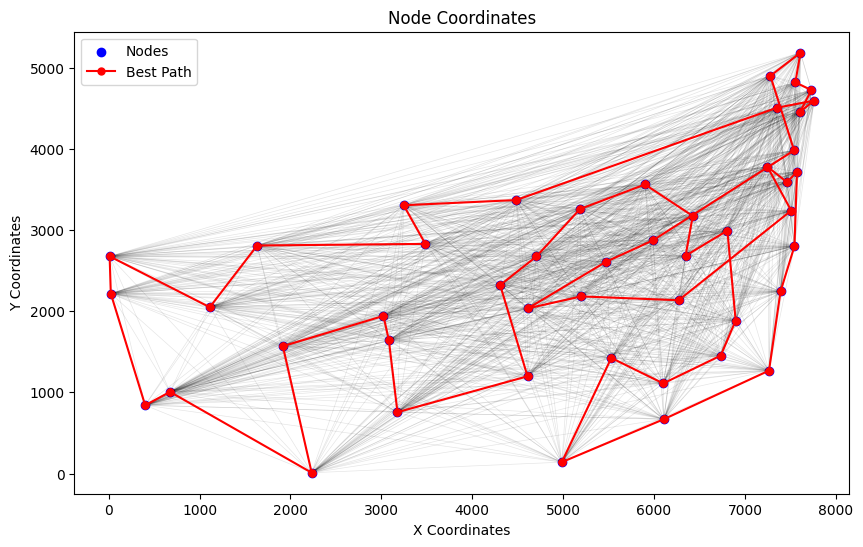

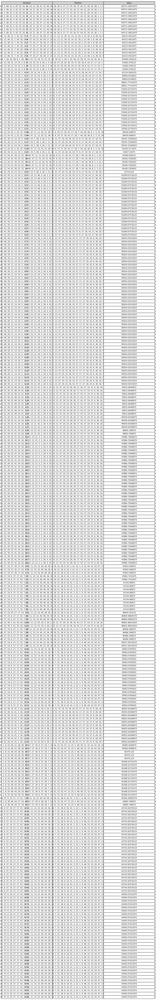

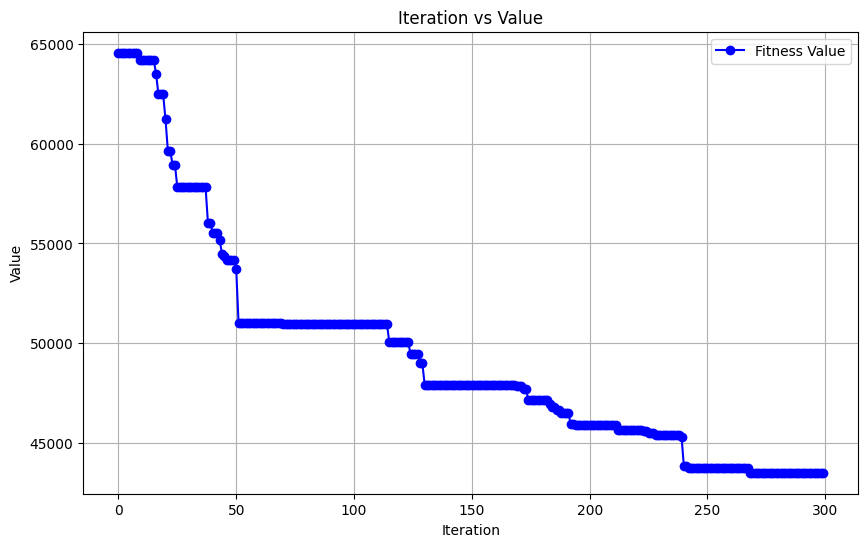

In [93]:
particleCount = 50
maxIterations = 300

psoV1 = ParticleSwarmOptimiserV1(
    nodeCount=att48.dimension,
    nodeCoordinates = att48.nodeCoordinates,
    distanceMatrix = att48.distanceMatrix,
    particleCount=particleCount,
    swapCount = 5,
    alpha = 1,
    beta = 1,
    gamma = 1,
    greedyInitialisation = True
)

psoV1.optimise(maxIterations)
bestPathV1, bestCostV1, historyV1, timeTakenV1 = psoV1.getBestSolution()

print("\nBest Path Found:", bestPathV1.tolist())
print("Best Cost:", bestCostV1)
print(f"time taken: {timeTakenV1}")
psoV1.visualise()
psoV1.showIterationHistory()
psoV1.showLossAgainstIterationGraph()

##### V2 <a name="V2-4"></a>

Also with updated parameters

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49

Best Path Found: [44, 7, 18, 28, 6, 19, 27, 43, 17, 30, 37, 36, 33, 12, 22, 16, 41, 34, 14, 13, 25, 32, 39, 48, 5, 4, 26, 35, 45, 24, 10, 42, 2, 29, 3, 38, 9, 8, 1, 40, 15, 23, 11, 21, 47, 20, 46, 31]
Best Cost: tensor(42019.9102)
time taken: 249.1046884059906


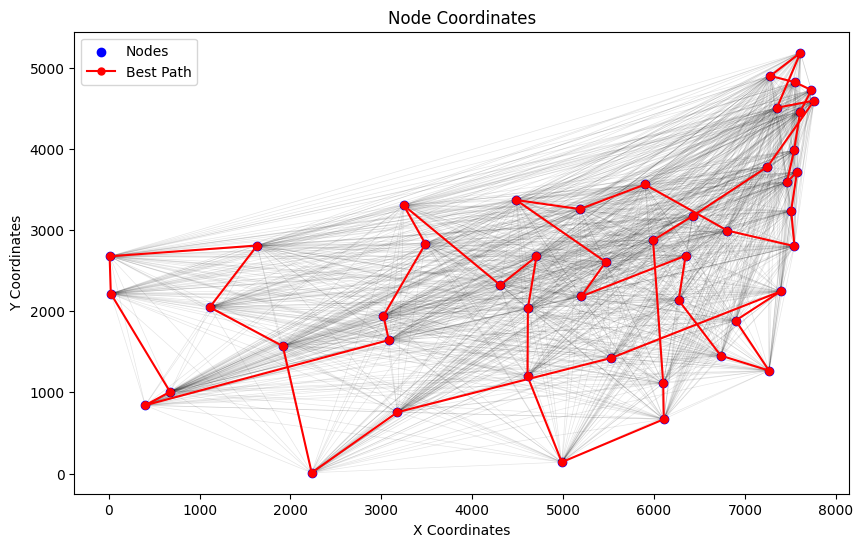

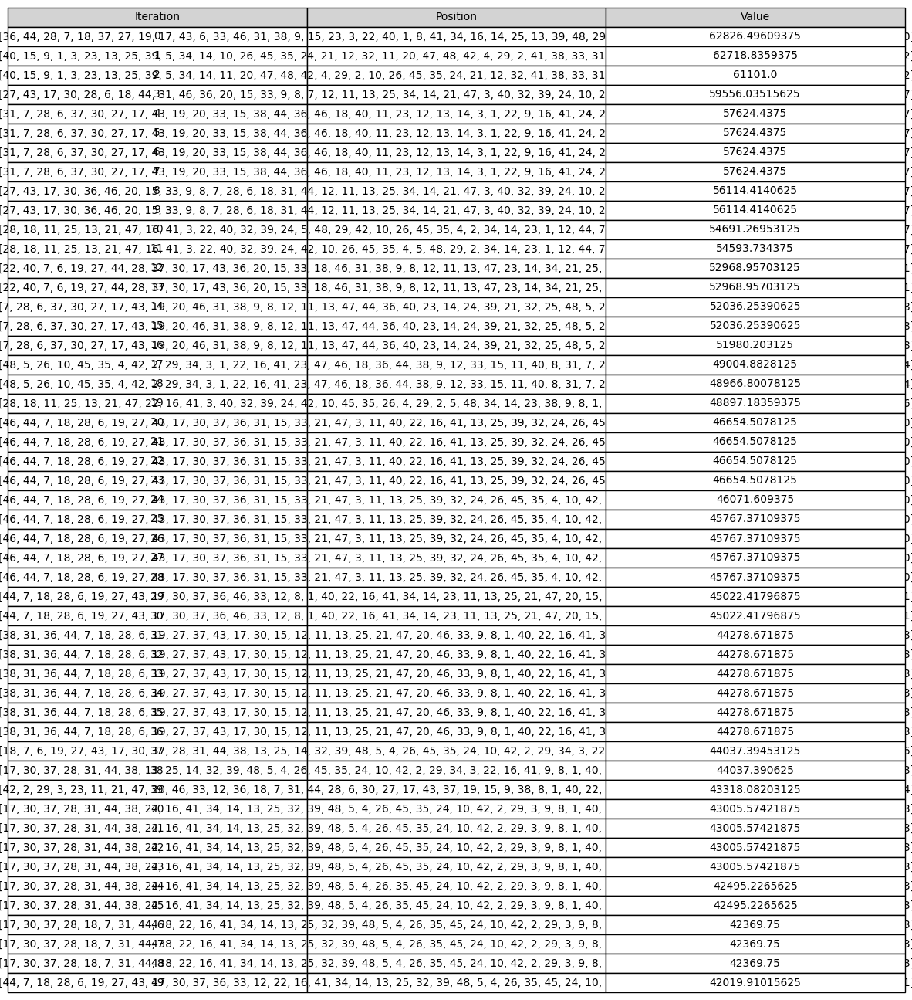

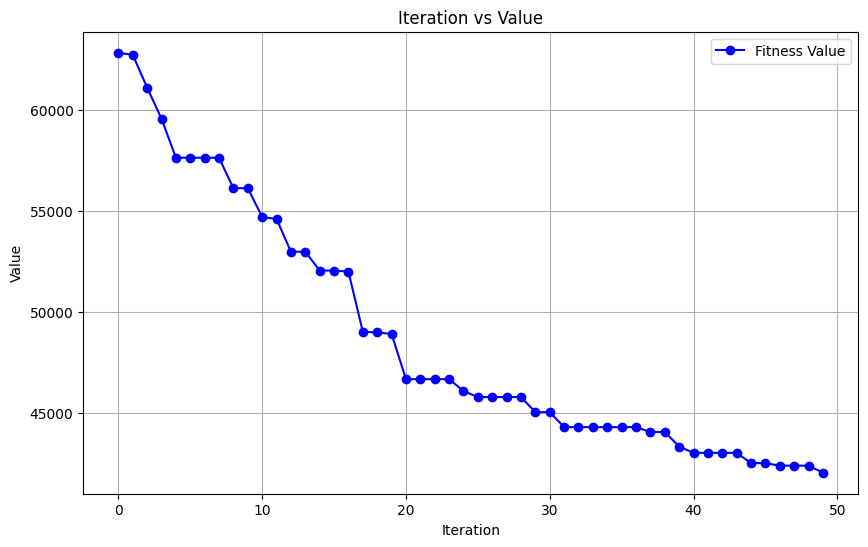

In [98]:
particleCount = 50
maxIterations = 50

psoV2 = ParticleSwarmOptimiserV2(
    nodeCount=att48.dimension,
    nodeCoordinates = att48.nodeCoordinates,
    distanceMatrix = att48.distanceMatrix,
    particleCount=particleCount,
    swapCount = 3,
    alpha = 1,
    beta = 1,
    gamma = 1,
    greedyInitialisation = True
)

psoV2.optimise(maxIterations)
bestPathV2, bestCostV2, historyV2, timeTakenV2 = psoV2.getBestSolution()

print("\nBest Path Found:", bestPathV2.tolist())
print("Best Cost:", bestCostV2)
print(f"time taken: {timeTakenV2}")
psoV2.visualise()
psoV2.showIterationHistory()
psoV2.showLossAgainstIterationGraph()

##### Comparing Results <a name="Comparing-Results-4"></a>

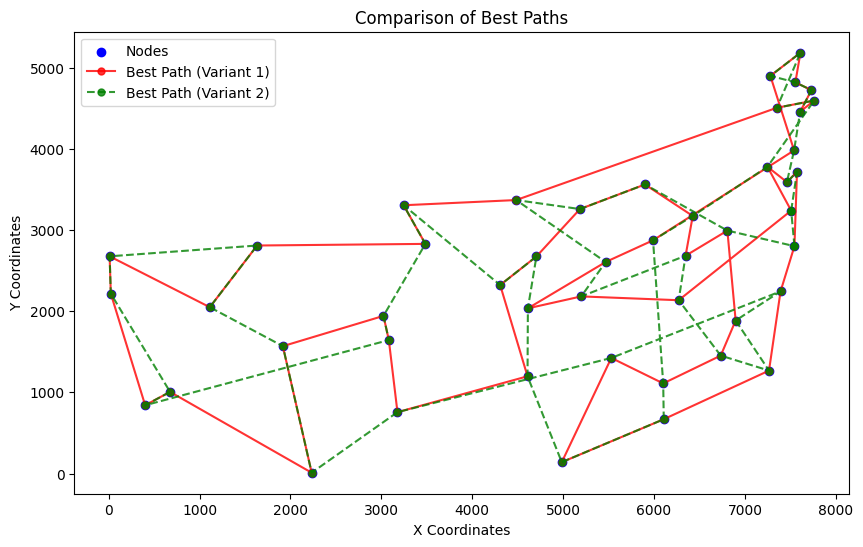

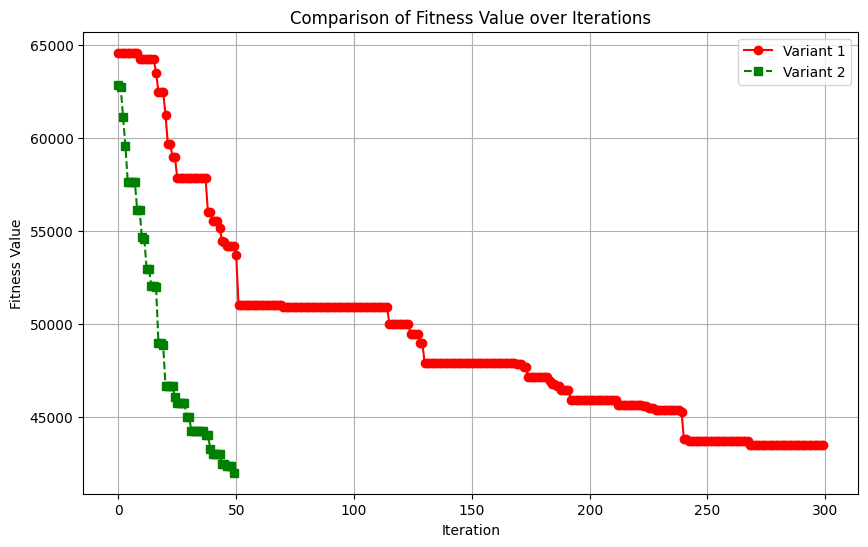

In [101]:
compareBestRoutes(psoV1, psoV2)
compareLossCurves(psoV1, psoV2)

### lin105 Analysis

In [ ]:
particle_count = 50
max_iterations = 100
inertia = 0.8
c1 = 1.5
c2 = 1.5

pso = ParticleSwarmOptimiserV2(
    nodeCount=lin105.dimension,
    distanceMatrix = lin105.distanceMatrix,
    particleCount=particle_count,
    inertia=inertia,
    particleCognition=c1,
    socialInfluence=c2
)

pso.optimise( max_iterations)
best_path, best_cost = pso.getBestSolution()

print("\nBest Path Found:", best_path.tolist())
print("Best Cost:", best_cost)

plotBestPath(lin105.nodeCoordinates, lin105.distanceMatrix, best_path)

## Comparison with Other Approaches

Both variants were based on approaches taken in 2 different papers. I will compare how the papers differ to each of my approaches here.

For approach 1, I updated each particle's velocity to be a sequence of swap operations, just like the paper. The paper also mentions an alpha and beta parameters to control local and global influence, but I changed this slightly by adding a gamma variable. This means that there is an extra variable to control randomness. Also, in the paper they take the approach of varying the size of the velocity by combining velocities of the local and global best. I found this to be very computationally intensive, so instead opted for changing the swap operations within the velocity, and keeping the overall velocity length the same. Overall, the changes I made were intended to try and guide updates more intelligently.

For approach 2, I was inspired by the other paper, which utilises genetic approaches. The paper mentions a k-opt approach, which is like a genetic crossover mutation. In my approach, I simplified this to take segments of the local and global best and insert them randomly to create new, better routes. This allows beneficial parts of good solutions to be directly transferred, and allows for better diversity.

### A brief comparison of burma14

In [1], burma14 is showcased as an example problem. They reach the optimal solution using 100 particles and 20000 iterations. However, my implementation reaches a near optimal solution with only 15 particles and 50 iterations, and reaches the optimal within 500. This is a significant improvement.

### A brief comparison of bays29

Paper 2 showcases their solution of the bays29 problem instance. As you can see from their graph compared to mine, my code reaches an optimal solution in the same, if not less iterations than theirs. This indicates that segment reinsertion could be just as effective as the k-opt mutation that they implement:

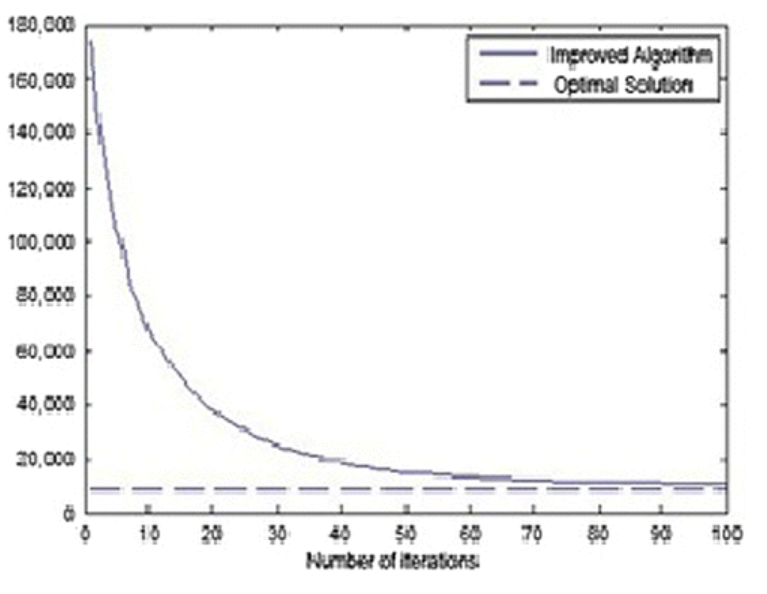

My solution using V2:


Best Path Found: [7, 23, 27, 8, 24, 1, 28, 6, 12, 9, 26, 3, 29, 5, 21, 2, 20, 10, 13, 16, 19, 4, 15, 18, 14, 17, 22, 11, 25]
Best Cost: tensor(9105.8750)
time taken: 94.54547500610352


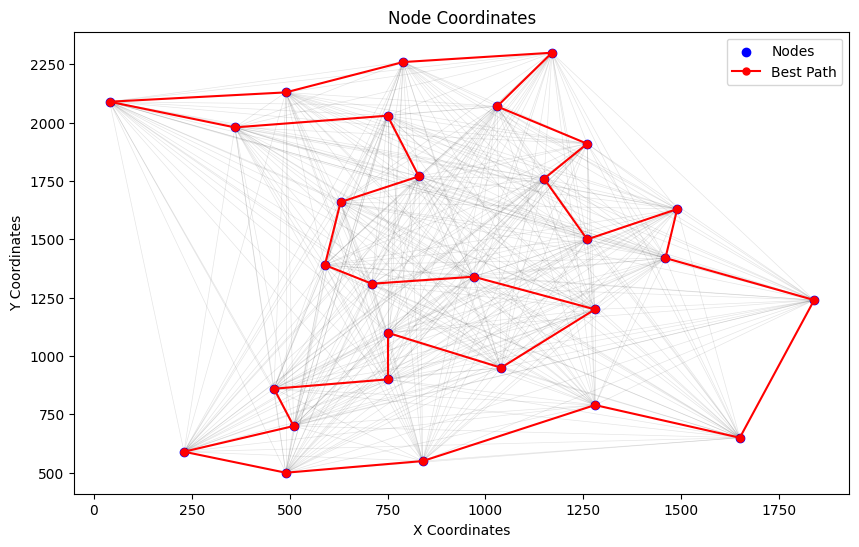

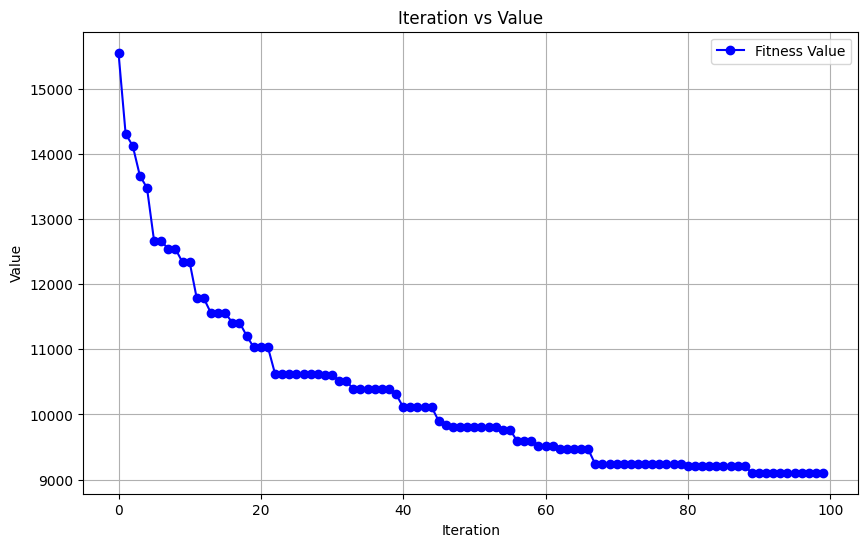

In [104]:
response = requests.get("https://raw.githubusercontent.com/mastqe/tsplib/refs/heads/master/bays29.tsp")
bays29 = TspParser(response.text)
particleCount = 20
maxIterations = 100

psoV2 = ParticleSwarmOptimiserV2(
    nodeCount=bays29.dimension,
    nodeCoordinates = bays29.nodeCoordinates,
    distanceMatrix = bays29.distanceMatrix,
    particleCount=particleCount,
    swapCount = 3,
    alpha = 1,
    beta = 1,
    gamma = 1,
    greedyInitialisation = True
)
psoV2.optimise(maxIterations)
bestPathV2, bestCostV2, historyV2, timeTakenV2 = psoV2.getBestSolution()

print("\nBest Path Found:", bestPathV2.tolist())
print("Best Cost:", bestCostV2)
print(f"time taken: {timeTakenV2}")
psoV2.visualise()
psoV2.showLossAgainstIterationGraph()

## Conclusion and future work

In this report I was able to explore 2 different approaches to the PSO algorithm in solving instances of the Travelling Salesman Problem. I was able to investigate whether velocity based swap sequences or segment reinsertion would be more effective. I also implemented parameters to modify the weight given to local vs global vs random influence, which allows fine tuned balancing between exploration and exploitation.

Overall, both approaches work well on standard sets of problem instances. However, for larger instances, V1 does not easily reach a good solution, whereas V2, using the segment reinsertion, is able to find optimal solutions in a reasonably amount of time. Also, V2 is shown to be at least as effective (on certain instances) as its parent approach in the paper given. It is also more scalable and fairly quick.

Future work could involve extending these algorithms to much larger problem sizes, such as those with thousands of nodes, which would provide insights into real world applicability. Also, it could be interesting to see how other heuristic approaches such as simulated annealing and ant colony optimisation could be compared or integrated with PSO.

## References

[1] Kang-Ping Wang. (2003). *Particle Swarm Optimization for Travelling Salesman Problem*. https://ieeexplore.ieee.org/document/1259748  
[2] Kievan Borna. (2015). *A combination of genetic algorithm and particle swarm optimization method for solving traveling salesman problem*. https://www.tandfonline.com/doi/full/10.1080/23311835.2015.1048581  
[3] Mastqe. (n.d.). *TSPLIB: A Repository of Symmetric TSP Data*. GitHub Repository. https://github.com/mastqe/tsplib  
[4] Marcos Castro. *tsp_pso*. GitHub Repository. https://github.com/marcoscastro/tsp_pso/blob/master/references/paper.pdf
